# HoughCircles for DE tracking

In this notebook, I implement the droplet tracking software using the HoughCircles algorithm.

I tried to use predictive cropping to avoid false positive detection, and to improve tracking efficiency (section 0). However, the cropping often goes to wrong places and never goes back when some images have low circle quality. Due to this reason, I switch back to the whole image detection for the moment (section 1). 

To improve the tracking accuracy, I use local minimum to correct the boundary location of detected circle (section 2). This gives the results subpixel accuracy, and more well defined circle position (circle goes through the darkest pixels). 

At the end, I generate the final inner droplet trajectory by subtracting outer trajectory from inner trajectory (section 3). 

In [1]:
import numpy as np
from skimage import io, filters, draw, util
import os
import matplotlib.pyplot as plt
import cv2
import matplotlib.patches as mpatch
from IPython.display import clear_output
import pandas as pd
from myimagelib.myImageLib import to8bit, show_progress, bestcolor, gauss1, readdata
import time
import trackpy as tp
import json
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter, argrelextrema, argrelmin
from scipy.ndimage import gaussian_filter1d
from de_utils import *
from scipy.interpolate import interp1d
import matplotlib as mpl
from nd2reader import ND2Reader

## 0 Work code

### 0.1 Determine hough_params

In [2]:
n = 187
analysis_folder = r"D:\nd2\tracking\{:02d}".format(n)
nd2Dir = r"D:\nd2\{:02d}.nd2".format(n)
with ND2Reader(nd2Dir) as images:
    num_images = len(images)
    img = images[0]
print('Total {:d} frames'.format(num_images))

Total 30000 frames


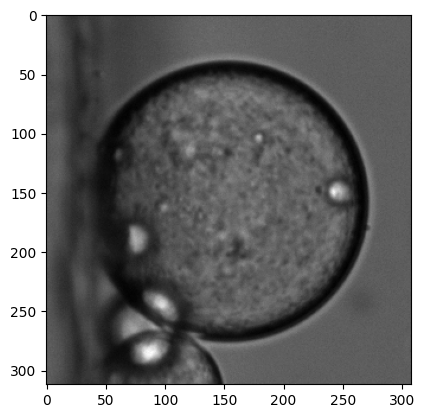

In [200]:
# show image 1 and manually crop
plt.imshow(img, cmap='gray')

<font color='red'> Set `Hough_maxRadius` and `Hough_minRadius`, in cases where no circle can be detected or the circle detected is way off, modify `Hough_dp`  

circles detected:  3


array([[245.5, 152.5,  10.8],
       [ 89.5, 283.5,   9.6],
       [ 73.5, 190.5,  10.9]], dtype=float32)

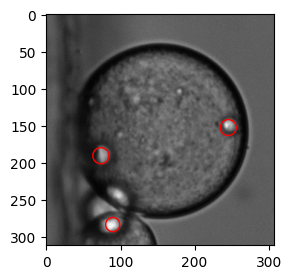

In [204]:
params_init = {"dp"       : 1 , 
               "minDist"  :  80,
               "param1"   :  100, 
               "param2"   :  15,  
               "maxRadius":  15,
               "minRadius":  8}
# Hough_minDist_init = params_init["maxRadius"]
# circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, Hough_dp_init, Hough_minDist_init, param1=Hough_param1_init,
#                                param2=Hough_param2_init, maxRadius=Hough_maxRadius_init, minRadius=Hough_minRadius_init)
circles = cv2.HoughCircles(to8bit(img), cv2.HOUGH_GRADIENT, **params_init)

fig, ax = plt.subplots(figsize=(3, 3), dpi=100)
ax.imshow(img, cmap='gray')
for circle in circles[0][:5]:
    circle_object = mpatch.Circle((circle[0], circle[1]), circle[2],
                                 fill=False, ec='red', lw=1)
    ax.add_patch(circle_object)
    
print("circles detected: ", circles.shape[1])
circles[0][:5]

Text(0, 0.5, 'circle detected')

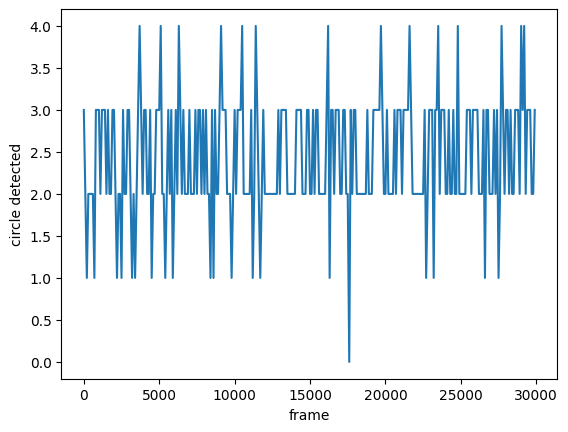

In [205]:
# Initial params
save_step = 1000 # save detection overlay image every save_step steps, int
number_of_circles = 3 # number of circles to be detected, the idea is to detect multiple circles and use linking criteria to filter out false detection
frames_to_analyze = range(0, num_images, 100)

# HoughCircles params
params = params_init

# initialize result containers
x_list = [] # x of circle
y_list = [] # y of circle
filename_list = [] # filename of raw image
nc_list = [] # number of circles detected in each frame
data_list = []

# initialize output folder
main_output_folder = analysis_folder
cropped_folder = os.path.join(main_output_folder, 'cropped')
if os.path.exists(main_output_folder) == False:
    os.makedirs(main_output_folder)
if os.path.exists(cropped_folder) == False:
    os.makedirs(cropped_folder)


t0 = time.monotonic()
count = 1

with ND2Reader(nd2Dir) as images:
    for i in frames_to_analyze:
        # read image and convert to 8-bit (HoughCircles requires 8-bit images)
        img = to8bit(images[i])

        fig = plt.figure(figsize=(3, 3))
        ax = fig.add_axes([0,0,1,1])
        ax.imshow(img, cmap='gray')
        circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, **params)
        
        if circles is not None: # check if any circle is detected 
            nc_list.append(len(circles[0]))       
            for circle in circles[0][:number_of_circles]:            
                data_item = pd.DataFrame({"x": circle[0], 
                                          "y": circle[1], 
                                          "r": circle[2],
                                          "frame": i}, index=[0])
                data_list.append(data_item)       
                circle_object = mpatch.Circle((circle[0], circle[1]), circle[2],
                                        fill=False, ec='red', lw=1)
                ax.add_patch(circle_object)  
        else:
            # if no circle is detected, set x, y to NaN
            # x, y = np.nan, np.nan
            data_item = pd.DataFrame({"x": np.nan, 
                                    "y": np.nan, 
                                    "r": np.nan,
                                    "frame": i}, index=[0])
            data_list.append(data_item)
            nc_list.append(0)

        if i % save_step == 0: # save image and detecting result for validating purpose
            fig.savefig(os.path.join(cropped_folder, '{:05d}.jpg'.format(i)))
        plt.pause(0.01)
        plt.close() # prevent figure from showing up inline
        show_progress((i+1)/num_images)
        t1 = time.monotonic()-t0
        print("\ntime: {0:.1f} s | processing speed: {1:.1f} frame/s".format(t1, count/t1))
        count += 1
        clear_output(wait=True)

    data = pd.concat(data_list, axis=0)

# save traj data in a *.csv file
data.to_csv(os.path.join(main_output_folder, 'traj.csv'), index=False)
# save HoughCircles params in a *.json file for future ref
with open(os.path.join(main_output_folder, "hough_params.json"), "w") as f:
    f.write(json.dumps(params))
# show number of circles detected each frame

plt.plot(frames_to_analyze, nc_list)
plt.xlabel("frame")
plt.ylabel("circle detected")

### 0.1 Link traj manually

In [206]:
t = pd.read_csv(os.path.join(analysis_folder, "finding.csv"))

In [207]:
t1 = tp.link(t, 20, memory=5)

Frame 29999: 3 trajectories present.


In [208]:
t1.particle.drop_duplicates().shape

(7354,)

In [214]:
t2 = tp.filter_stubs(t1, 100)

In [215]:
t2.particle.drop_duplicates().shape

(102,)

([<matplotlib.axis.XTick at 0x1b432851b80>,
 [Text(0.0, 0, '0'),
  Text(1.0, 0, '1'),
  Text(2.0, 0, '176'),
  Text(3.0, 0, '217'),
  Text(4.0, 0, '346'),
  Text(5.0, 0, '459'),
  Text(6.0, 0, '497'),
  Text(7.0, 0, '524'),
  Text(8.0, 0, '549'),
  Text(9.0, 0, '599'),
  Text(10.0, 0, '748'),
  Text(11.0, 0, '799'),
  Text(12.0, 0, '817'),
  Text(13.0, 0, '965'),
  Text(14.0, 0, '1047'),
  Text(15.0, 0, '1074'),
  Text(16.0, 0, '1084'),
  Text(17.0, 0, '1181'),
  Text(18.0, 0, '1233'),
  Text(19.0, 0, '1288'),
  Text(20.0, 0, '1297'),
  Text(21.0, 0, '1332'),
  Text(22.0, 0, '1385'),
  Text(23.0, 0, '1448'),
  Text(24.0, 0, '1477'),
  Text(25.0, 0, '1493'),
  Text(26.0, 0, '1660'),
  Text(27.0, 0, '1896'),
  Text(28.0, 0, '1998'),
  Text(29.0, 0, '2036'),
  Text(30.0, 0, '2112'),
  Text(31.0, 0, '2149'),
  Text(32.0, 0, '2188'),
  Text(33.0, 0, '2242'),
  Text(34.0, 0, '2289'),
  Text(35.0, 0, '2290'),
  Text(36.0, 0, '2370'),
  Text(37.0, 0, '2548'),
  Text(38.0, 0, '2605'),
  Text(39

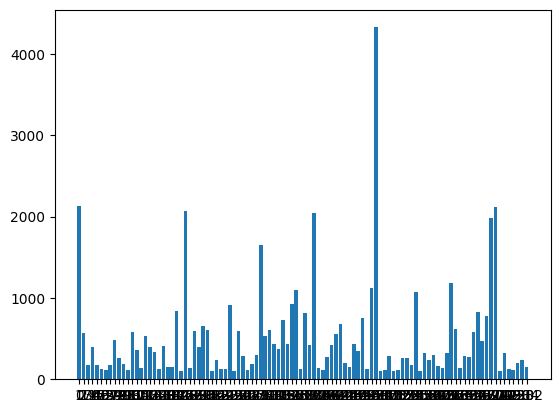

In [216]:
# particle number histogram
count_list = []
for _, g in t2.groupby("particle"):
    count_list.append(len(g))
plt.bar(t2.particle.drop_duplicates().astype("string"), count_list)
plt.xticks(t2.particle.drop_duplicates().astype("string"))

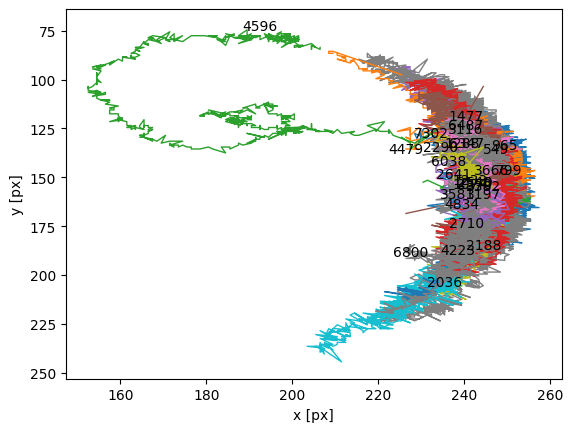

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [220]:
tp.plot_traj(t2, label="particle")

In [218]:
t2 = t2.loc[t2.x > 125]

In [219]:
t2.shape

(24812, 5)

In [23]:
t2 = t2.query("particle not in [133, 147]")

In [223]:
t2.particle = 0

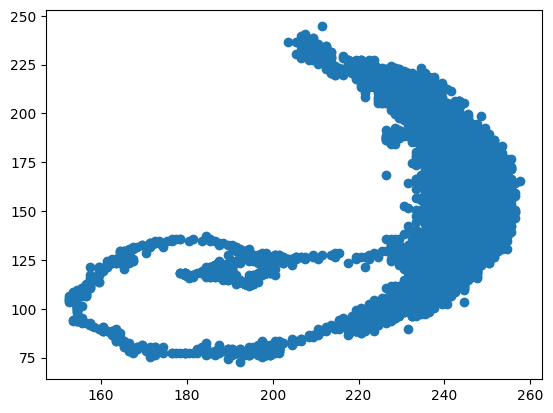

In [221]:
plt.scatter(t2.x, t2.y)

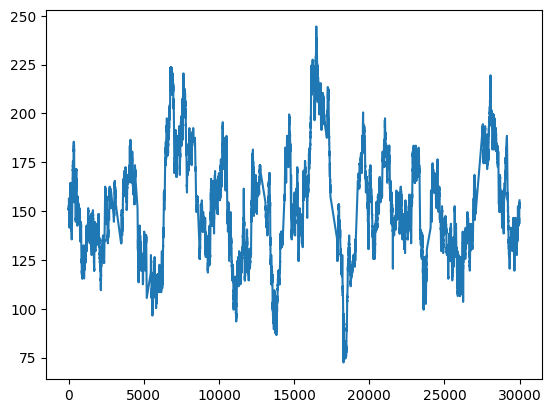

In [222]:
plt.plot(t2.y)

In [224]:
t2.to_csv(os.path.join(analysis_folder, "tracking.csv"), index=False)

### 0.2 Seek other hough param set that are good for missing frames

In [3]:
t = pd.read_csv(os.path.join(analysis_folder, "tracking.csv"))
pos = t.set_index("frame")
pos = pos.reindex(np.arange(pos.index[0], 1 + pos.index[-1]))
missing_frames = pos.loc[np.isnan(pos.x)]
missing_frame_index = pos.loc[np.isnan(pos.x)].index
num_missing = len(missing_frame_index)
num_total = len(pos)
print("{0:d}/{1:d} frames missing".format(num_missing, num_total))

2278/30000 frames missing


Note on mar 14, pick up on 187 supp tracking!

In [7]:
with open(os.path.join(analysis_folder, "hough_params.json")) as f:
    params_init = json.load(f)
params_init

{'dp': 1,
 'minDist': 80,
 'param1': 100,
 'param2': 15,
 'maxRadius': 15,
 'minRadius': 8}

In [8]:
params = {'dp': 1,
 'minDist': 80,
 'param1': 120,
 'param2': 12,
 'maxRadius': 15,
 'minRadius': 8}

Text(0, 0.5, 'circle detected')

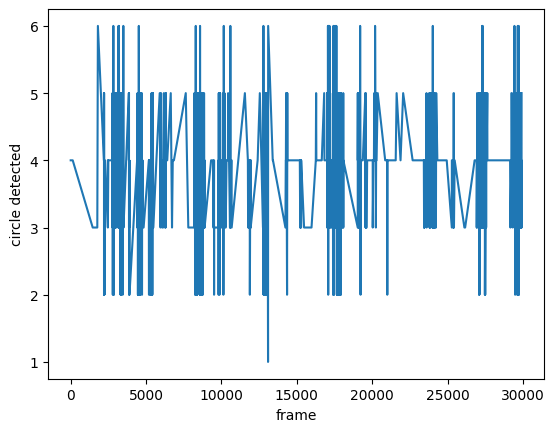

In [10]:
# Initial params
display_step = 5
number_of_circles = 3 # number of circles to be detected, the idea is to detect multiple circles and use linking criteria to filter out false detection
frames_to_analyze = missing_frames.sort_index().index

# initialize result containers
x_list = [] # x of circle
y_list = [] # y of circle
filename_list = [] # filename of raw image
nc_list = [] # number of circles detected in each frame
data_list = []

# initialize output folder
main_output_folder = analysis_folder
cropped_folder = os.path.join(main_output_folder, 'cropped')
if os.path.exists(main_output_folder) == False:
    os.makedirs(main_output_folder)
if os.path.exists(cropped_folder) == False:
    os.makedirs(cropped_folder)


t0 = time.monotonic()
count = 1

with ND2Reader(nd2Dir) as images:
    count = 0
    for i in frames_to_analyze:
        # read image and convert to 8-bit (HoughCircles requires 8-bit images)
        img = to8bit(images[i])
        circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, **params)
        tmp = []
        if circles is not None: # check if any circle is detected   
            nc_list.append(len(circles[0])) 
            for circle in circles[0][:number_of_circles]:            
                data_item = pd.DataFrame({"x": circle[0], 
                                          "y": circle[1], 
                                          "r": circle[2],
                                          "frame": i}, index=[0])
                data_list.append(data_item)
                tmp.append(data_item)
                
                
        else:
            # if no circle is detected, set x, y to NaN
            # x, y = np.nan, np.nan
            data_item = pd.DataFrame({"x": np.nan, 
                                    "y": np.nan, 
                                    "r": np.nan,
                                    "frame": i}, index=[0])
            data_list.append(data_item)
            nc_list.append(0) 

        if count % display_step == 0:
            fig = plt.figure(figsize=(3, 3))
            ax = fig.add_axes([0,0,1,1])
            ax.imshow(img, cmap='gray')
            if len(tmp) > 0:
                for item in tmp:
                    circle_object = mpatch.Circle((item.x, item.y), item.r,
                                        fill=False, ec='red', lw=1)
                    ax.add_patch(circle_object)  
            plt.pause(0.01)
            plt.close() # prevent figure from showing up inline
            show_progress((count+1)/len(frames_to_analyze))
            t1 = time.monotonic()-t0
            print("\ntime: {0:.1f} s | processing speed: {1:.1f} frame/s".format(t1, count/t1))
            clear_output(wait=True)
        count += 1

data = pd.concat(data_list, axis=0)

plt.plot(frames_to_analyze, nc_list)
plt.xlabel("frame")
plt.ylabel("circle detected")

Concatenate the supplementary tracking.
    

In [11]:
t = pd.read_csv(os.path.join(analysis_folder, "tracking.csv"))
t_supp = data

In [16]:
t1 = tp.link(t_supp, 40, memory=1000)

Frame 29905: 3 trajectories present.


In [17]:
t1.particle.drop_duplicates().shape

(146,)

In [25]:
t2 = t1.loc[t1.x>140]

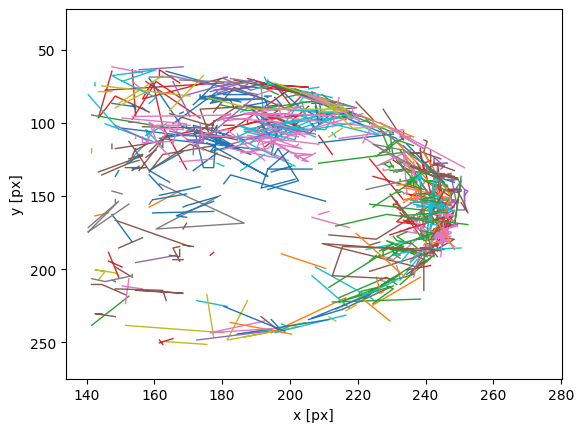

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [20]:
tp.plot_traj(t2)

In [26]:
len(t2.particle.drop_duplicates())

98

In [23]:
len(t2)

2940

In [31]:
t3 = tp.filter_stubs(t2, 50)

In [32]:
t3.particle.drop_duplicates().shape

(16,)

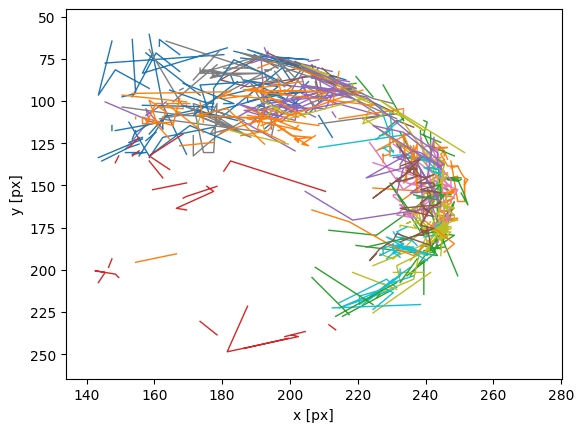

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [33]:
tp.plot_traj(t3)

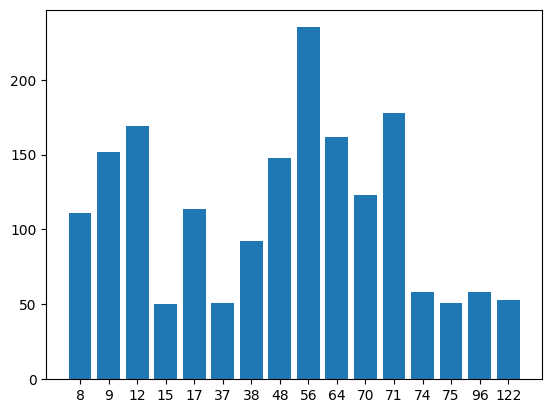

In [55]:
traj_length_distribution(t3)

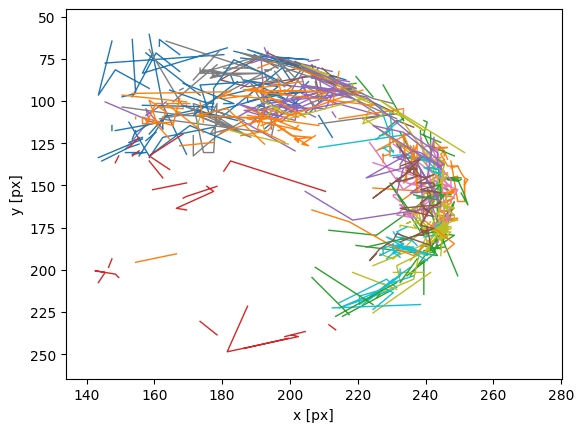

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [56]:
tp.plot_traj(t3)

In [58]:
t4 = tp.filter_stubs(t3, 100)

In [59]:
t4.shape

(1392, 5)

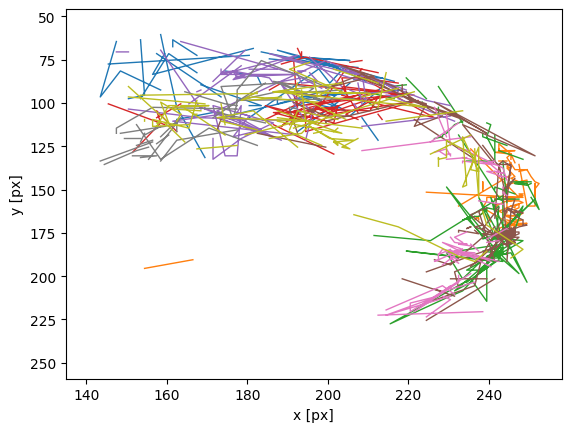

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [60]:
tp.plot_traj(t4)

In [64]:
t4.to_csv(r"C:\Users\liuzy\Documents\test-tracker\187\t4.csv", index=False)

In [65]:
t5 = t4.query("particle in [9,12,56,64,71]")

In [66]:
t5.shape

(896, 5)

In [67]:
t5.frame.drop_duplicates().shape

(870,)

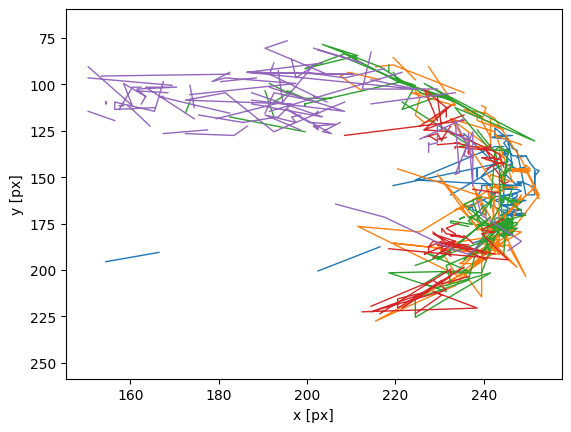

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [68]:
tp.plot_traj(t5)

In [70]:
t6 = tp.link(t5, 1000, memory=1000)

Frame 24156: 1 trajectories present.


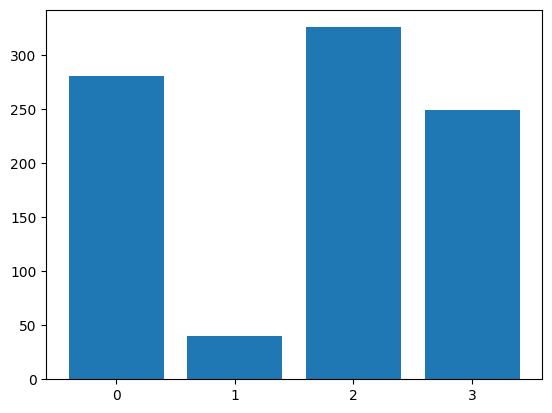

In [71]:
traj_length_distribution(t6)

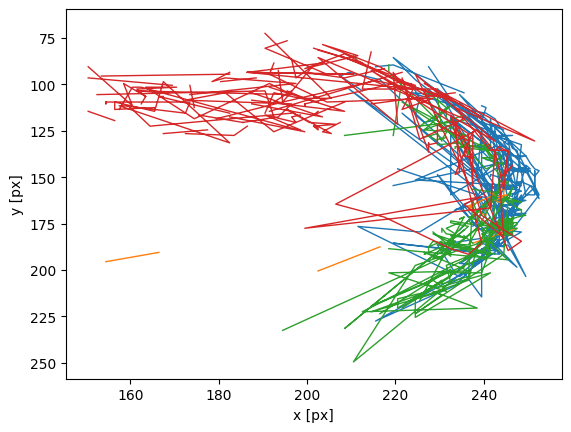

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [72]:
tp.plot_traj(t6)

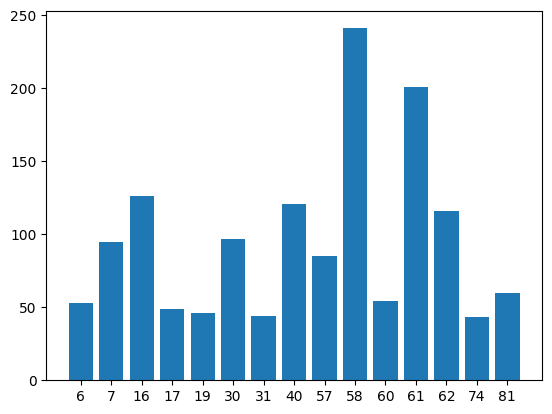

In [43]:
traj_length_distribution(t5)

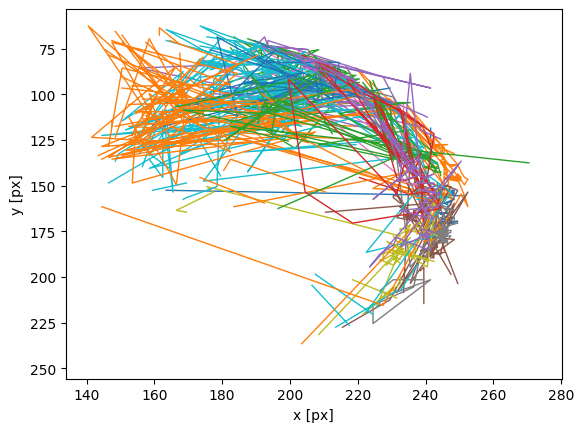

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [44]:
tp.plot_traj(t5)

In [46]:
t6 = tp.link(t5, 1000, memory=1000)

Frame 27637: 1 trajectories present.


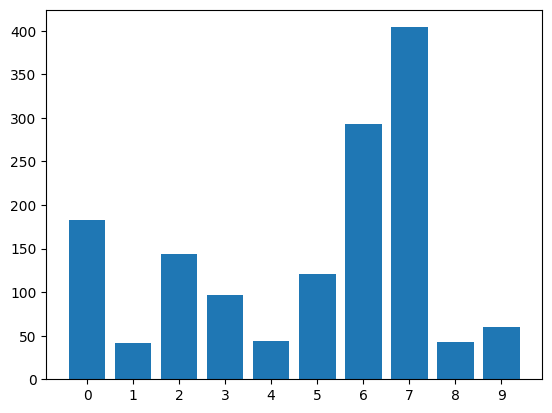

In [47]:
traj_length_distribution(t6)

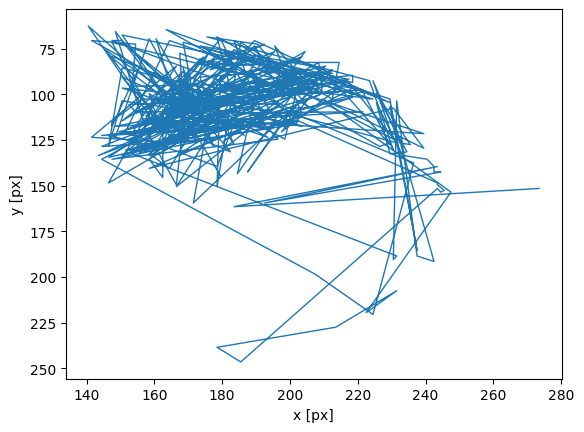

<AxesSubplot: xlabel='x [px]', ylabel='y [px]'>

In [49]:
tp.plot_traj(t6.loc[t6.particle==7])

In [54]:
t6.to_csv(r"C:\Users\liuzy\Documents\test-tracker\187\t6.csv", index=False)

In [258]:
t2.to_csv(os.path.join(analysis_folder, "tracking.csv"), index=False)

In [52]:
np.array(0).astype("uint8") - np.array(2).astype("uint8")

254

### 0.3 Manually insert coords in missing frames

Start an interactive session, where frames with missing droplets are displayed. The software will read the mouse click coords and set the x, y for that frame.

In [65]:
analysis_folder = r"D:\nd2\tracking\190"
t = pd.read_csv(os.path.join(analysis_folder, "tracking.csv"))

In [66]:
pos = t.set_index("frame")
pos = pos.reindex(np.arange(pos.index[0], 1 + pos.index[-1]))
missing_frame_index = pos.loc[np.isnan(pos.x)].index
num_missing = len(missing_frame_index)
num_total = len(pos)
print("{0:d}/{1:d} frames missing".format(num_missing, num_total))

0/30000 frames missing


If there are frames missing, go to `manual_entry_droplets.py`.

### 0.4 Subpixel correction param test

In [193]:
params = {"range_factor": 0.3,
          "thres": 10,
          "method": "minimum",
          "sample": 5,
          "sample_range": (np.pi/2, np.pi*3/2)}

oq: 0.43, cq: 0.62


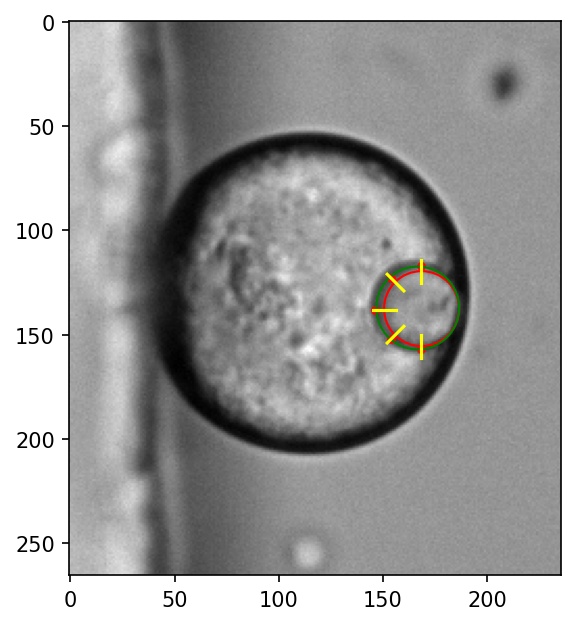

In [195]:
# single frame
frame = 2000

with ND2Reader(nd2Dir) as images:
    img = images[frame]
t1 = pd.read_csv(os.path.join(analysis_folder, "tracking.csv")).set_index("frame")

x0, y0, r0 = t1.at[frame, "x"], t1.at[frame, "y"], t1.at[frame, "r"]
original_circle = {"x": x0, "y": y0, "r": r0}
corrected_circle = subpixel_correction(original_circle, img, plot=True, **params)

oq = circle_quality_std(img, original_circle)
cq = circle_quality_std(img, corrected_circle)
print("oq: {0:.2f}, cq: {1:.2f}".format(oq, cq))

In [196]:
with open(os.path.join(analysis_folder, "correction_params.json"), "w") as f:
    f.write(json.dumps(params))

### 0.5 Correction report

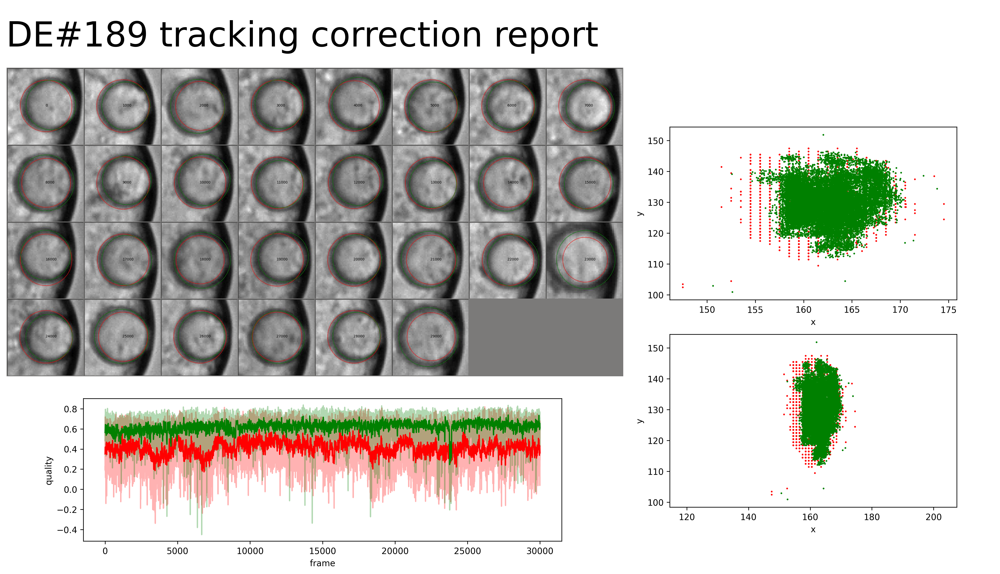

In [261]:
n = 189
analysis_folder = r"D:\nd2\tracking\{:02d}".format(n)
generate_correction_report(analysis_folder)

### 0.6 Iterative correction

### 0.7 Generate pictures for poster

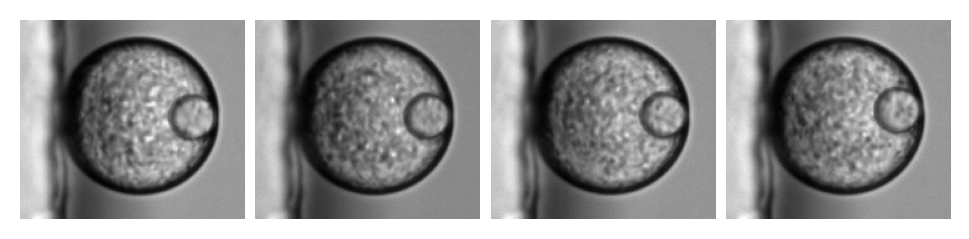

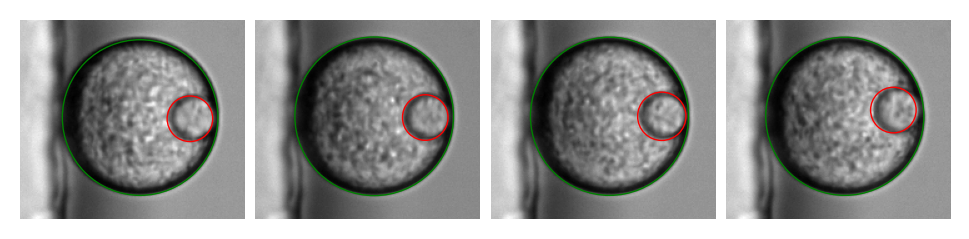

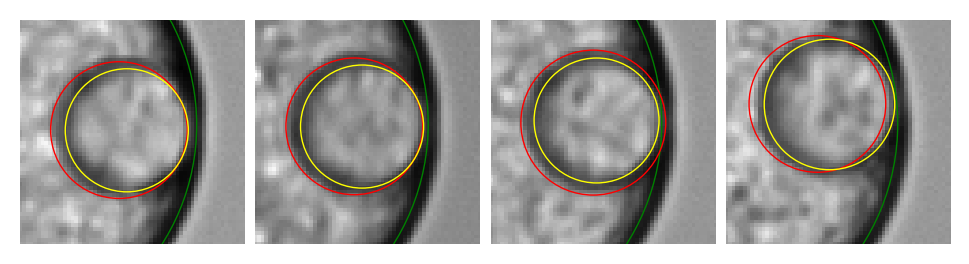

In [8]:
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\03"
img_folder = r"D:\DE\06012022\03\8-bit"
original_traj0 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t0l.csv")).set_index("frame")
original_traj1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
corrected_traj0 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t0lc.csv")).set_index("frame")
corrected_traj1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")
fig, ax = plt.subplots(1, 4, dpi=200, gridspec_kw={"wspace":0.05})
for i in range(0, 4):
    frame = i * 1000
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    ax[i].imshow(img, cmap="gray")
    ax[i].axis("off")
    ax[i].set_xlim([50, 230])
    ax[i].set_ylim([210, 50])


fig, ax = plt.subplots(1, 4, dpi=200, gridspec_kw={"wspace":0.05})
for i in range(0, 4):
    frame = i * 1000
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    ax[i].imshow(img, cmap="gray")
    ax[i].axis("off")
    # show inner tracking
    circ = mpatch.Circle((original_traj0.x.loc[frame], original_traj0.y.loc[frame]), original_traj0.r.loc[frame],
                        fill=False, color="green", lw=.5)
    ax[i].add_patch(circ)
    # show outer tracking
    circ1 = mpatch.Circle((original_traj1.x.loc[frame], original_traj1.y.loc[frame]), original_traj1.r.loc[frame],
                        fill=False, color="red", lw=.5)
    ax[i].add_patch(circ1)
    ax[i].set_xlim([50, 230])
    ax[i].set_ylim([210, 50])
    
fig, ax = plt.subplots(1, 4, dpi=200, gridspec_kw={"wspace":0.05})
for i in range(0, 4):
    frame = i * 1000
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    ax[i].imshow(img, cmap="gray")
    ax[i].axis("off")
    # show inner tracking
    circ = mpatch.Circle((corrected_traj0.x.loc[frame], corrected_traj0.y.loc[frame]), corrected_traj0.r.loc[frame],
                        fill=False, color="green", lw=.5)
    ax[i].add_patch(circ)
    # show outer tracking
    
    circ1 = mpatch.Circle((original_traj1.x.loc[frame], original_traj1.y.loc[frame]), original_traj1.r.loc[frame],
                        fill=False, color="red", lw=.5)
    ax[i].add_patch(circ1)
    # show corrected tracking
    ct = subpixel_correction({"x": original_traj1.x.loc[frame], 
                              "y": original_traj1.y.loc[frame], 
                              "r": original_traj1.r.loc[frame]}, img, range_factor=0.2, 
                              sample=4, sample_range=(1.57, 4.71), method="minimum", plot=False)
    circ1c = mpatch.Circle((ct["x"], ct["y"]), ct["r"], fill=False, color="yellow", lw=.5)
    ax[i].add_patch(circ1c)
    ax[i].set_xlim([160, 220])
    ax[i].set_ylim([160, 100])

In [3]:
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\03"
original_traj1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
corrected_traj2 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\03\c1"
img_folder = r"D:\DE\06012022\03\8-bit"
corrected_traj1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")


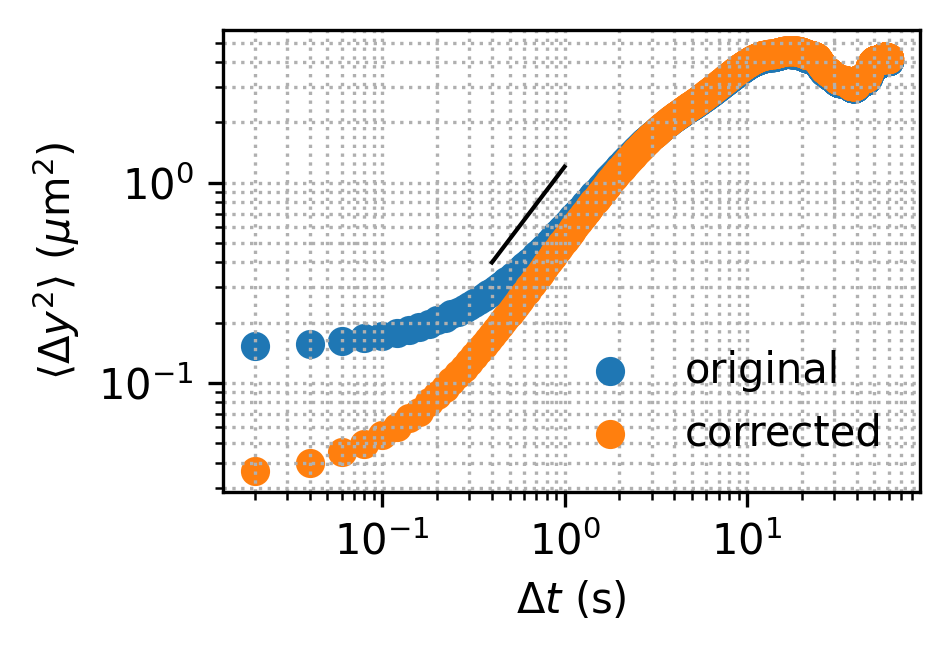

In [12]:
# MSD
MPP = 0.33
FPS = 50
t1 = original_traj1.reset_index()
t2 = corrected_traj1.reset_index()
t3 = corrected_traj2.reset_index()
# t1.y = gaussian_filter1d(t1.y, sigma=9/4)
# t2.y = gaussian_filter1d(t2.y, sigma=9/4)
plt.figure(figsize=(3, 2), dpi=300)
msdo = tp.msd(t1, mpp=MPP, fps=FPS, max_lagtime=3000)
plt.scatter(msdo.lagt, msdo["<y^2>"], label="original")
# msdc = tp.msd(t2, mpp=MPP, fps=FPS, max_lagtime=3000)
# plt.scatter(msdc.lagt, msdc["<y^2>"], label="corrected")
msdc = tp.msd(t3, mpp=MPP, fps=FPS, max_lagtime=3000)
plt.scatter(msdc.lagt, msdc["<y^2>"], label="corrected")
# plt.xlim([0, .5])
# plt.ylim([0, .5])
plt.xlabel("$\Delta t$ (s)")
plt.ylabel("$\langle \Delta y^2 \\rangle$ ($\mu$m$^2$)")
plt.loglog()
plt.grid(which="both", ls=":")
plt.legend(frameon=False)

x = np.array([0.4, 1])
y = 1.2 * x ** 1.2 
plt.plot(x, y, lw=1, color="black")

Text(0, 0.5, 'count')

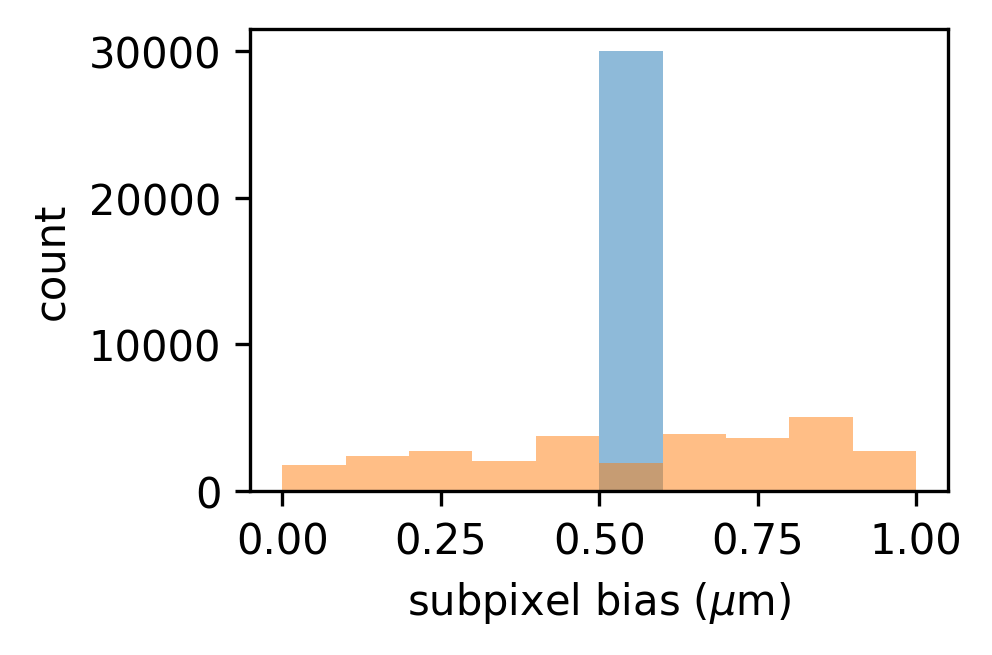

In [17]:
# subpixel bias
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\03"
original_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
corrected_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")

plt.figure(figsize=(3, 2), dpi=300)
histx, bin_edges = np.histogram(original_traj.x - original_traj.x.apply(np.floor),
                                   bins=np.linspace(0, 1, 11))
plt.bar(bin_edges[:-1], histx, 
        align="edge", width=bin_edges[1]-bin_edges[0], 
        color=bestcolor(0), alpha=0.5, label="original")
histx, bin_edges = np.histogram(corrected_traj.x - corrected_traj.x.apply(np.floor),
                               bins=np.linspace(0, 1, 11))
plt.bar(bin_edges[:-1], histx, 
        align="edge", width=bin_edges[1]-bin_edges[0], 
        color=bestcolor(1), alpha=0.5, label="corrected")   
plt.xlabel("subpixel bias ($\mu$m)")
plt.ylabel("count")

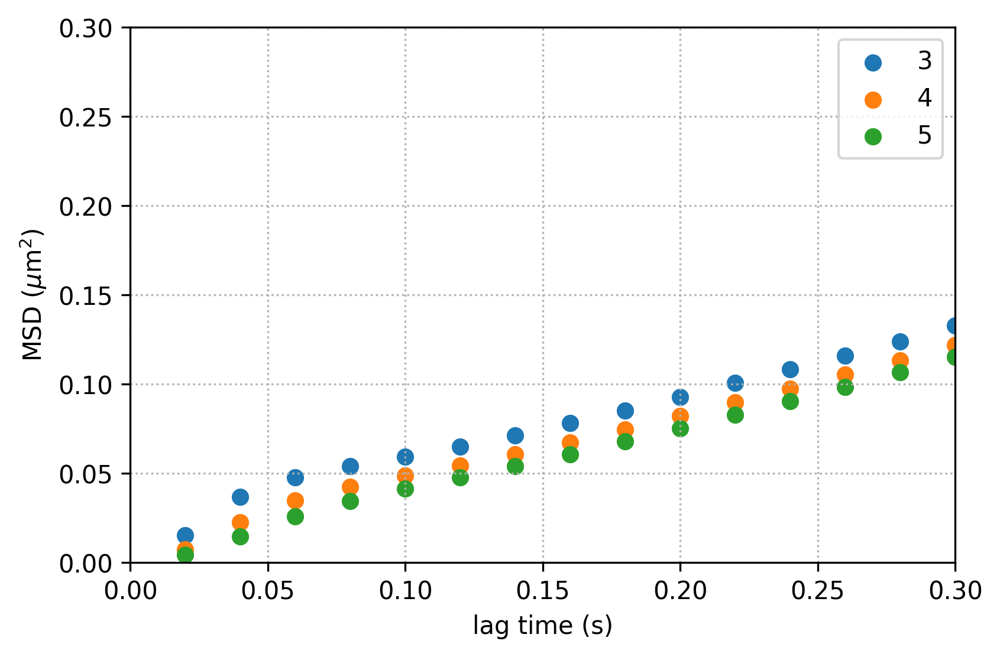

In [20]:
# smooth traj
plt.figure(dpi=300)
for w in range(3, 6):
    t2 = corrected_traj1.reset_index()
    t2.y = gaussian_filter1d(t2.y, sigma=w/4)
    msdc = tp.msd(t2, mpp=MPP, fps=FPS, max_lagtime=3000)
    plt.scatter(msdc.lagt, msdc["<y^2>"], label=w)
plt.xlim([0, .3])
plt.ylim([0, .3])
plt.xlabel("lag time (s)")
plt.ylabel("MSD ($\mu$m$^2$)")
plt.grid(which="both", ls=":")
plt.legend()

(50.0, 230.0, 210.0, 50.0)

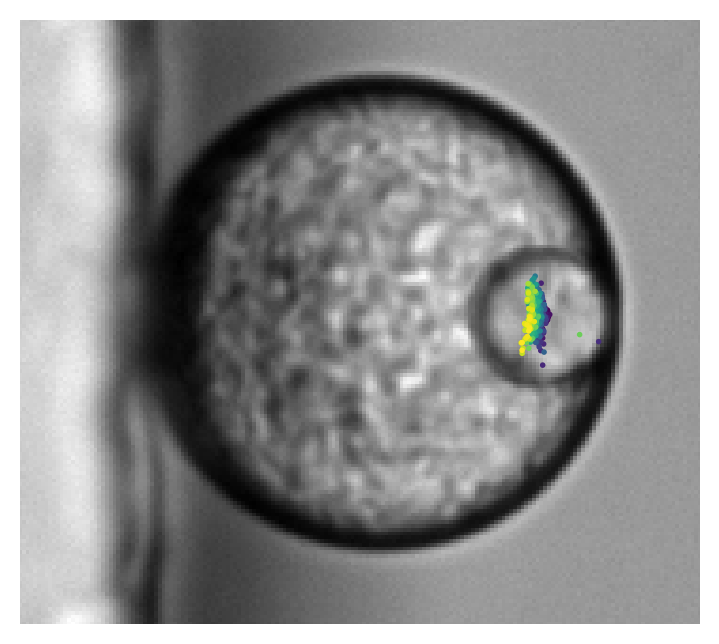

In [9]:
# traj
fig, ax = plt.subplots(dpi=200)
img = io.imread(os.path.join(img_folder, "00000.tif"))
ax.imshow(img, cmap="gray")
ax.set_xlim([50, 230])
ax.set_ylim([210, 50])
# ax.scatter(original_traj1[::100].x, original_traj1[::100].y, 
#             c="red", s=1)
ax.scatter(corrected_traj1[::100].x, corrected_traj1[::100].y, 
            c=corrected_traj1[::100].index, s=1)
ax.axis("off")

Text(0, 0.5, 'detected radius (px)')

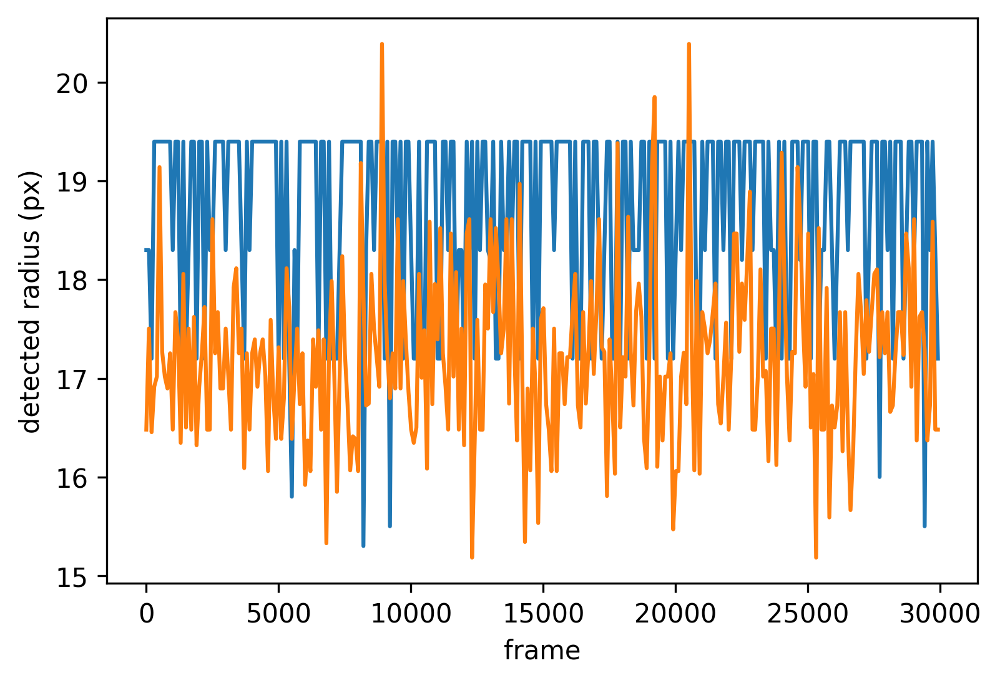

In [109]:
# radius time series

plt.figure(dpi=300)
t1 = original_traj1.reset_index()[::100]
t2 = corrected_traj1.reset_index()[::100]
plt.plot(t1.frame, t1.r)
plt.plot(t2.frame, t2.r)
plt.xlabel("frame")
plt.ylabel("detected radius (px)")

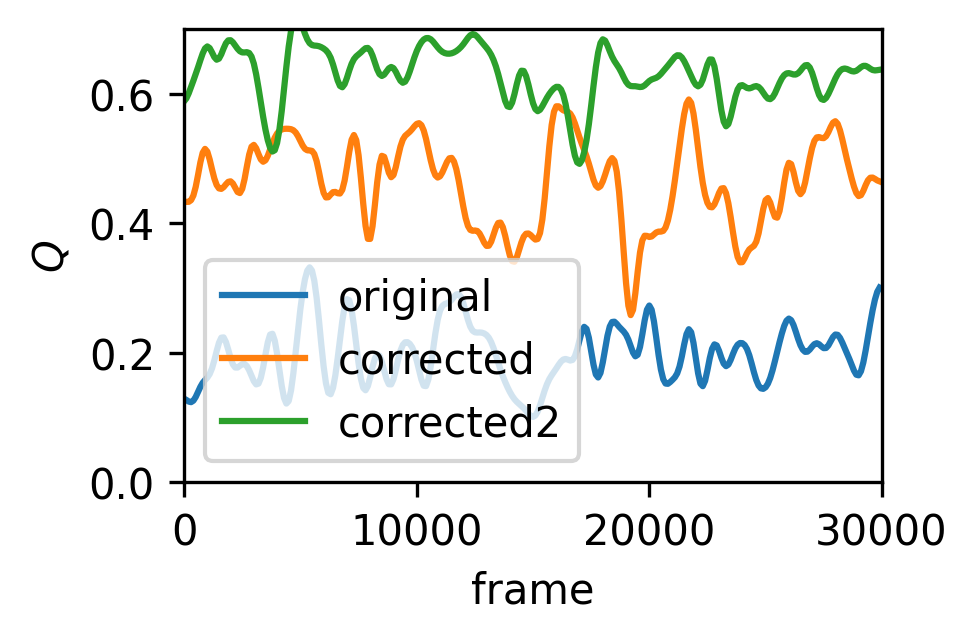

In [132]:
# quality time series

plt.figure(figsize=(3, 2), dpi=300)
t1 = original_traj1.reset_index()[::100]
t2 = corrected_traj1.reset_index()[::100]
t3 = corrected_traj2.reset_index()[::100]
plt.plot(t2.frame, gaussian_filter1d(t2.original_quality, 3), label="original")
plt.plot(t2.frame, gaussian_filter1d(t2.corrected_quality, 3), label="corrected")
plt.plot(t2.frame, gaussian_filter1d(t3.corrected_quality, 3), label="corrected2")
plt.xlabel("frame")
plt.ylabel("$Q$")
plt.xlim([0, 30000])
plt.ylim([0, .7])
plt.legend()

In [124]:
t1 = original_traj1.reset_index()
t2 = corrected_traj1.reset_index()
t3 = corrected_traj2.reset_index()

In [129]:
t = t2.original_quality > t2.corrected_quality
bad = len(t.where(t==True).dropna())
q = bad / len(t2)
q

0.13839791902888016

In [130]:
t = t3.original_quality > t3.corrected_quality
bad = len(t.where(t==True).dropna())
q = bad / len(t)
q

0.029146935236443672

### 0.7 Tracking quality check

Check the quality of tracking by overlaying detected droplets with real images.

In [24]:
folder = r"C:\Users\liuzy\Documents\06012022"
save_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\02\overlay-prelim"
if os.path.exists(save_folder) == False:
    os.makedirs(save_folder)
n = 2
img_folder = os.path.join(folder, "{:02d}".format(n))
traj = pd.read_csv(os.path.join(folder, "Analysis", "{:02d}".format(n), "fulltraj_t1l.csv")).set_index("frame")

radius = 17
dpi = 200
for i in range(0, 30000, 50):
    try:
        x = traj.at[i, "x"]
        y = traj.at[i, "y"]
    except:
        continue
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(i)))
    h, w = img.shape
    fig = plt.figure(figsize=(w/dpi, h/dpi), dpi=dpi)
    ax = fig.add_axes([0,0,1,1])
    ax.imshow(img, cmap="gray")
    ax.axis("off")
    
    circ = mpatch.Circle((x, y), radius, fc=(0,0,0,0), ec="red")
    ax.add_patch(circ)
    fig.savefig(os.path.join(save_folder, "{:05d}.jpg".format(i)))
    plt.close()

In [4]:
list(range(1))

[0]

## 1 Whole image tracking and multiple detections per frame

Although I know that I only want to track one droplet, and the current code will only return the best circle (the highest score feature in the accumulator) due to the large `minDist` setting, sometimes the droplet I want to track is not the best circle. 

If we track multiple circles in an image, and then use the `link` function in tracking analysis, we might be able to detect the droplets in more frames.

In this scheme, since we won't know which circle is the actual droplet we are looking for, using the position of frame 1 to crop frame 2 is not a good idea. Therefore, we run the circle detection on full images.

In [15]:
analysis_folder = r'D:\nd2\tracking\193'
nd2_dir = r"D:\nd2\193.nd2"
with ND2Reader(nd2_dir) as images:
    num_images = len(images)
    img = images[0]
print('Total {:d} frames'.format(num_images))

Total 30000 frames


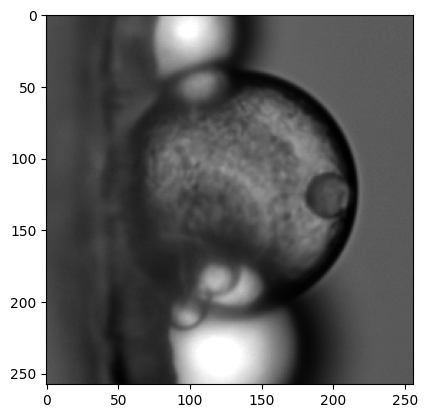

In [16]:
# show image 1 and manually crop
plt.imshow(img, cmap='gray')

<font color='red'> Set `Hough_maxRadius` and `Hough_minRadius`, in cases where no circle can be detected or the circle detected is way off, modify `Hough_dp`  

circles detected:  3


array([[195.5, 135.5,  16.4],
       [134.5, 189.5,  15.2],
       [108.5,  54.5,  14.4]], dtype=float32)

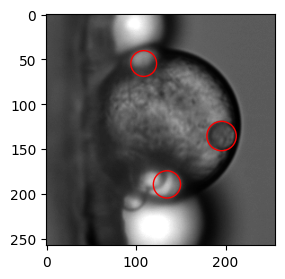

In [21]:
params_init = {"dp"       : 1 , 
               "minDist"  :  80,
               "param1"   :  100, 
               "param2"   :  15,  
               "maxRadius":  17,
               "minRadius":  13}
# Hough_minDist_init = params_init["maxRadius"]
# circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, Hough_dp_init, Hough_minDist_init, param1=Hough_param1_init,
#                                param2=Hough_param2_init, maxRadius=Hough_maxRadius_init, minRadius=Hough_minRadius_init)
circles = cv2.HoughCircles(to8bit(img), cv2.HOUGH_GRADIENT, **params_init)

fig, ax = plt.subplots(figsize=(3, 3), dpi=100)
ax.imshow(img, cmap='gray')
for circle in circles[0][:5]:
    circle_object = mpatch.Circle((circle[0], circle[1]), circle[2],
                                 fill=False, ec='red', lw=1)
    ax.add_patch(circle_object)
    
print("circles detected: ", circles.shape[1])
circles[0][:5]

Text(0, 0.5, 'circle detected')

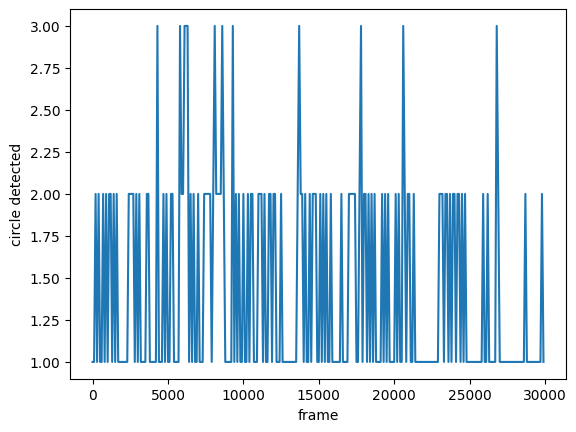

In [22]:
# Initial params
save_step = 10 # save detection overlay image every save_step steps, int
number_of_circles = 3 # number of circles to be detected, the idea is to detect multiple circles and use linking criteria to filter out false detection
frames_to_analyze = range(0, num_images, 100)

# HoughCircles params
params = params_init

# initialize result containers
x_list = [] # x of circle
y_list = [] # y of circle
filename_list = [] # filename of raw image
nc_list = [] # number of circles detected in each frame
data_list = []

# initialize output folder
main_output_folder = analysis_folder
cropped_folder = os.path.join(main_output_folder, 'cropped')
if os.path.exists(main_output_folder) == False:
    os.makedirs(main_output_folder)
if os.path.exists(cropped_folder) == False:
    os.makedirs(cropped_folder)


t0 = time.monotonic()
count = 1

with ND2Reader(nd2_dir) as images:
    for i in frames_to_analyze:
        # read image and convert to 8-bit (HoughCircles requires 8-bit images)
        img = to8bit(images[i])

        fig = plt.figure(figsize=(3, 3))
        ax = fig.add_axes([0,0,1,1])
        ax.imshow(img, cmap='gray')
        circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, **params)
        
        if circles is not None: # check if any circle is detected        
            for circle in circles[0][:number_of_circles]:            
                data_item = pd.DataFrame({"x": circle[0], 
                                          "y": circle[1], 
                                          "r": circle[2],
                                          "frame": i}, index=[0])
                data_list.append(data_item)       
                circle_object = mpatch.Circle((circle[0], circle[1]), circle[2],
                                        fill=False, ec='red', lw=1)
                ax.add_patch(circle_object)  
        else:
            # if no circle is detected, set x, y to NaN
            # x, y = np.nan, np.nan
            data_item = pd.DataFrame({"x": np.nan, 
                                    "y": np.nan, 
                                    "r": np.nan,
                                    "frame": i}, index=[0])
            data_list.append(data_item)

        if i % save_step == 0: # save image and detecting result for validating purpose
            fig.savefig(os.path.join(cropped_folder, '{:05d}.jpg'.format(i)))
        plt.pause(0.01)
        plt.close() # prevent figure from showing up inline
        show_progress((i+1)/num_images)
        t1 = time.monotonic()-t0
        print("\ntime: {0:.1f} s | processing speed: {1:.1f} frame/s".format(t1, count/t1))
        count += 1
        clear_output(wait=True)

        data = pd.concat(data_list, axis=0)

# save traj data in a *.csv file
data.to_csv(os.path.join(main_output_folder, 'traj.csv'), index=False)
# save HoughCircles params in a *.json file for future ref
with open(os.path.join(main_output_folder, "hough_params.json"), "w") as f:
    f.write(json.dumps(params))
# show number of circles detected each frame
il, nl = [], []
for i, g in data.groupby("frame"):
    il.append(i)
    nl.append(len(g))
plt.plot(il, nl)
plt.xlabel("frame")
plt.ylabel("circle detected")

### Link droplet trajectory

In [177]:
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\00"
img_folder = r"D:\DE\06012022\00\8-bit"
traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1.csv"))
# traj = data.assign(frame=data.filename.astype("int")//50)

In [178]:
t = tp.link(traj, 30, memory=5)

Frame 29999: 3 trajectories present.


In [179]:
t1 = tp.filter_stubs(t, 500)

In [423]:
analysis_folder = r"C:\Users\liuzy\Documents\06032022\Analysis\03"
img_folder = r"D:\DE\06032022\03\8-bit"
t1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t0l.csv"))

([<matplotlib.axis.XTick at 0x183de325a60>], [Text(0, 0, '')])

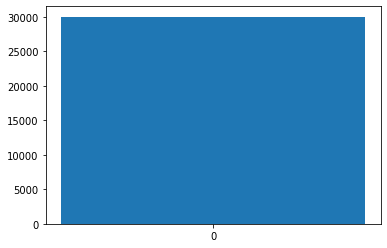

In [424]:
# particle number histogram
count_list = []
for _, g in t1.groupby("particle"):
    count_list.append(len(g))
plt.bar(t1.particle.drop_duplicates().astype("string"), count_list)
plt.xticks(t1.particle.drop_duplicates().astype("string"))

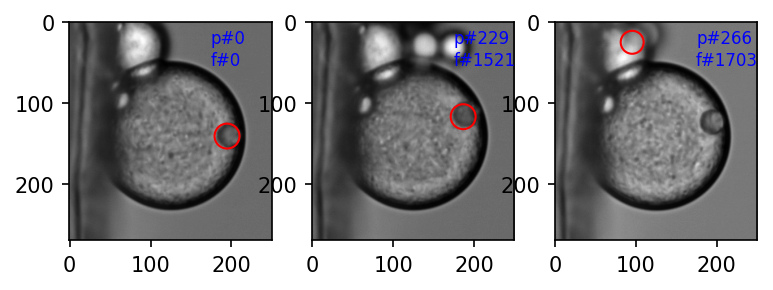

In [402]:
# check which particle is True inner droplet and which is false detection
n_images = len(t1.particle.drop_duplicates())
ncols = 4
nrows = n_images // ncols
if n_images % ncols != 0:
    nrows += 1
fig = plt.figure(figsize=(2*ncols, 2*nrows), dpi=150)
count = 1
for particle in t1.particle.drop_duplicates():
    sub_traj = t1.loc[t1.particle==particle]
    ax = fig.add_subplot(nrows, ncols, count)
    count += 1
    for num, i in sub_traj.iterrows():   
        img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(int(i.frame))))
        ax.imshow(img, cmap="gray")
        circle_object = mpatch.Circle((i.x, i.y), i.r, 
                                     fill=False, ec='red', lw=1)
        ax.add_patch(circle_object)
        ax.annotate("p#{:d}".format(particle), (0.7, 0.9), xycoords="axes fraction", color="blue", fontsize=8)
        ax.annotate("f#{:d}".format(int(i.frame)), (0.7, 0.8), xycoords="axes fraction", color="blue", fontsize=8)
#         plt.pause(0.1)
#         plt.close()
        break

In [403]:
t1 = t1.query("particle in [0, 229]")

In [404]:
# print duplicated frames (frames with more than 1 particles)
dup = pd.concat(g for _, g in t1.groupby("frame") if len(g) > 1)
dup.head()

ValueError: No objects to concatenate

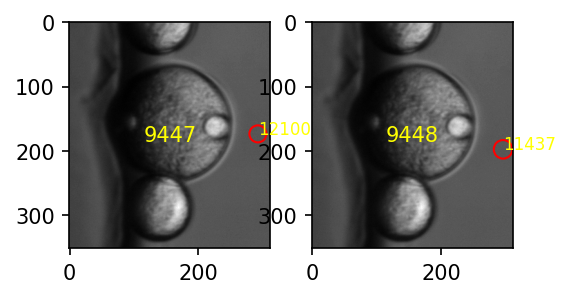

In [237]:
# plot duplicates
img_folder = r"D:\DE\06012022\01\8-bit"
n_images = len(dup.index.drop_duplicates())
ncols = 4
nrows = n_images // ncols
if n_images % ncols != 0:
    nrows += 1
fig = plt.figure(figsize=(2*ncols, 2*nrows), dpi=150)
count = 1

for filename in dup.index.drop_duplicates():
    ax = fig.add_subplot(nrows, ncols, count)
    count += 1
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(int(filename))))
    subdata = dup.loc[dup.index==filename]
    ax.imshow(img, cmap="gray")
    for num, i in subdata.iterrows():
        circle_object = mpatch.Circle((i.x, i.y), i.r, fill=False, ec="red", lw=1)
        ax.add_patch(circle_object)
        ax.annotate("{:d}".format(int(i.particle)), (i.x, i.y), color="yellow", fontsize=8)
        ax.annotate("{:d}".format(int(num)), (0.5, 0.5), 
                    color="yellow", xycoords="axes fraction",
                    verticalalignment="center", horizontalalignment="center")

In [407]:
t1.to_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv"), index=False)

In [145]:
t1.frame *= 50

C:\Users\liuzy\Miniconda3\lib\site-packages\pandas\core\generic.py:5507: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value


In [406]:
t1.particle = 0

In [405]:
t1

,x,y,r,frame,particle
0,194.5,140.5,15.4,0,0
1,196.5,141.5,15.4,1,0
2,196.5,140.5,15.4,2,0
3,195.5,140.5,14.3,3,0
4,194.5,138.5,15.4,4,0
...,...,...,...,...,...
15708,188.5,151.5,15.4,15250,229
15709,188.5,151.5,15.4,15251,229
15710,187.5,152.5,14.2,15252,229
15711,187.5,151.5,14.3,15253,229


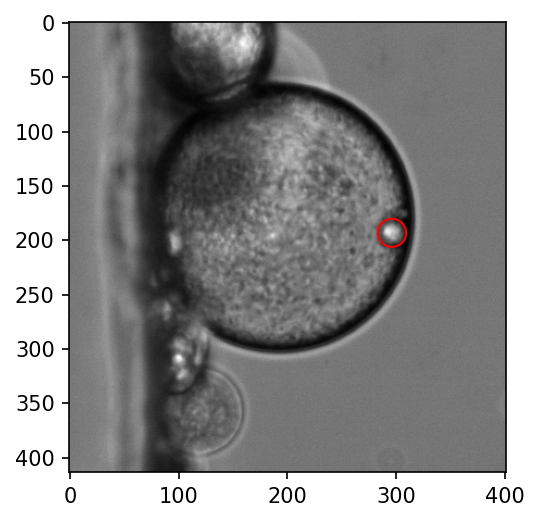

In [218]:
# verify tracking quality
analysis_folder = r"C:\Users\liuzy\Documents\05312022\Analysis\02"
img_folder = r"D:\DE\05312022\02\8-bit"
t1 = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")
for frame, i in t1[::100].iterrows():
    fig = plt.figure(figsize=(3, 3), dpi=150)
    ax = fig.add_axes([0,0,1,1])
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(int(frame))))
    ax.imshow(img, cmap="gray")
    circle_object = mpatch.Circle((i.x, i.y), i.r, fill=False, ec="red", lw=1)
    ax.add_patch(circle_object)
    plt.pause(0.1)
    
    clear_output(wait=True)

### Compare two trackings

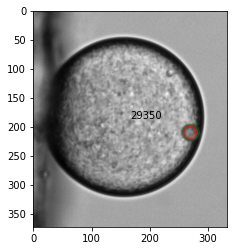

In [175]:
# Compare two trackings
folder = r"C:\Users\liuzy\Documents\05312022"
n = 6
traj1 = pd.read_csv(os.path.join(folder, "Analysis", "{:02d}".format(n), 
                                 "t.csv")).set_index("frame")
traj2 = pd.read_csv(os.path.join(folder, "Analysis", "{:02d}".format(n), 
                                 "t1c.csv")).set_index("frame")
traj1.index = traj1.index.astype("int")
traj2.index = traj2.index.astype("int")
combine_traj = pd.concat([traj1, traj2], axis=1, keys=["traj1", "traj2"])

for num, i in combine_traj.iterrows():
    fig = plt.figure(figsize=(3, 3))
    ax = fig.add_axes([0,0,1,1])
    img = io.imread(os.path.join(folder, "{:02d}".format(n), "{:05d}.tif".format(num)))
    ax.imshow(img, cmap="gray")
    c1 = mpatch.Circle((i["traj1"].x, i["traj1"].y), i["traj1"].r, 
                       fill=False, ec="red", lw=2, alpha=0.5)
    c2 = mpatch.Circle((i["traj2"].x, i["traj2"].y), i["traj2"].r, 
                       fill=False, ec="green", lw=1, alpha=0.5)
    ax.annotate("{:05d}".format(int(num)), (0.5, 0.5), xycoords="axes fraction")
    ax.add_patch(c1)
    ax.add_patch(c2)
    plt.pause(.01)
    plt.close()
    clear_output(wait=True)
#     if num == 0:
#         break

### Overview of the tracking results

This section provides an overview of the tracking, to see if the quality is satisfactory. This will include:
1. x time series: inner, outer, subtraction
2. y time series: inner, outer, subtraction
3. droplet size time series: outer and inner
4. sketch of inner droplet trajectory
5. subpixel bias: x, y, subtraction

In [64]:
outer_traj.sample().x.values[0]

-6.520288998599213

## 2 Subpixel accuracy

The Hough Circles algorithm works well in detecting circle objects in images. However, the accuracy in this implementation is not great, as the position resolution is only 1 pixel (all the positions of circles detected are xx.5). 

### 2.1 Cross-boundary Gaussian fitting (and local minimum correction)

A possible way to achieve subpixel accuracy is to find maxima in cross-boundary intensity profiles and modify the original detected position. 

Here, we want to design a function, which takes in the original circle detection information (x0, y0, r0), as well as the raw image, and use cross-boundary intensity profile fitting to return a corrected circle detection (x1, y1, r1).

oq: -0.31, cq: 0.41


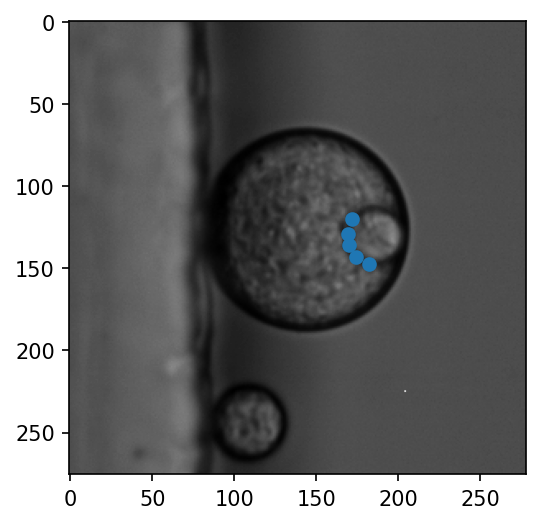

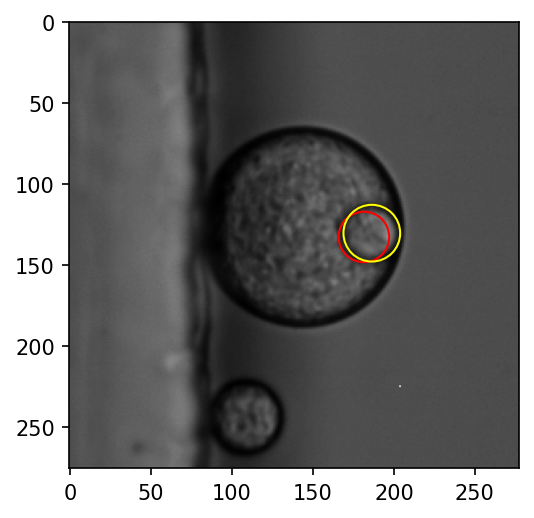

In [66]:
analysis_folder = r"C:\Users\liuzy\Documents\06012022\Analysis\03"
img_folder = r"D:\DE\06012022\03\8-bit"
frame = 19369
raw_img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
inner_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
x0, y0, r0 = inner_traj.x.loc[frame], inner_traj.y.loc[frame], inner_traj.r.loc[frame]
original_circle = {"x": x0, "y": y0, "r": r0}
corrected_circle = subpixel_correction(original_circle, raw_img, range_factor=0.2, 
                                         plot=True, thres=10, method="minimum", sample=5, sample_range=(np.pi/2, 3/2*np.pi))
fig = plt.figure(figsize=(3, 3), dpi=150)
ax = fig.add_axes([0,0,1,1])
ax.imshow(raw_img, cmap="gray")
cobj = mpatch.Circle((original_circle["x"], original_circle["y"]), original_circle["r"], fill=False, ec="red", lw=1)
ax.add_patch(cobj)
ccor = mpatch.Circle((corrected_circle["x"], corrected_circle["y"]), corrected_circle["r"], fill=False, ec="yellow", lw=1)
ax.add_patch(ccor)

oq = circle_quality_std(raw_img, original_circle)
cq = circle_quality_std(raw_img, corrected_circle)
print("oq: {0:.2f}, cq: {1:.2f}".format(oq, cq))

### 2.2 Compare circle detection quality

We need a metric of circle detection quality. An intuitive metric is the standard deviation of boundary pixel intensities. A good circle should have smaller variation in boundary pixel intensities, hence smaller standard deviation.

In [47]:
folder = r"C:\Users\liuzy\Documents\06032022"
n = 0
raw_img = io.imread(os.path.join(folder, "{:02d}".format(n), "00000.tif"))
inner_traj = pd.read_csv(os.path.join(folder, "Analysis", "{:02d}".format(n), "traj1.csv"))
x0, y0, r0 = inner_traj.x.iloc[0], inner_traj.y.iloc[0], inner_traj.r.iloc[0]
original_circle = {"x": x0, "y": y0, "r": r0}
corrected_circle = subpixel_correction(original_circle, raw_img, range_factor=0.2, plot=False, thres=10, method="minimum")

circle radius: 14.7
distsq threshold: 10
number of pixels on circle: 61
std circle: 23.57
std img: 35.58
quality original: -0.15
quality: 0.34


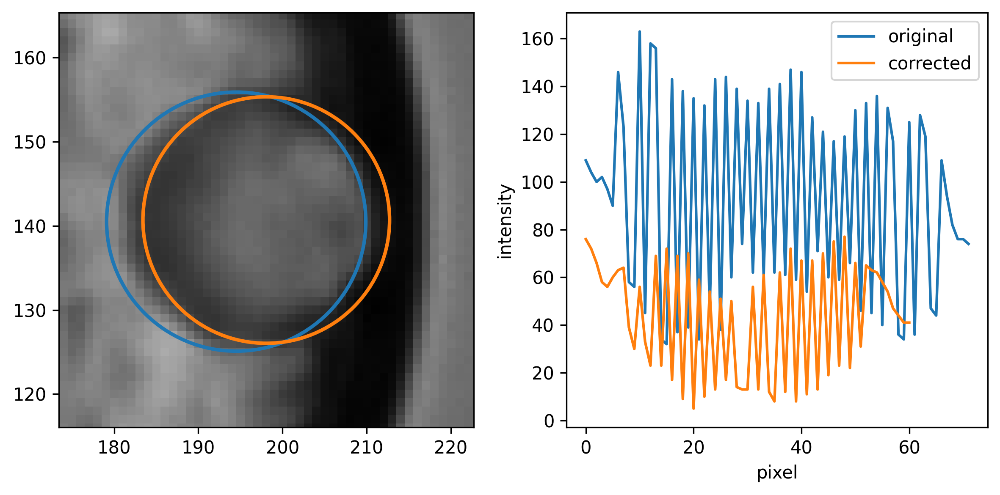

In [51]:
# get all the pixel coords on the circle
x0, y0, r0 = original_circle["x"], original_circle["y"], original_circle["r"]
x, y, r = corrected_circle["x"], corrected_circle["y"], corrected_circle["r"]
# 1. make X, Y coordinates of all image pixels
Y, X = np.mgrid[0:raw_img.shape[0], 0:raw_img.shape[1]]
# 2. compute distance (square) matrix from each pixel to circle center
dist = (X-x) ** 2 + (Y-y) ** 2 - r ** 2 
dist_o = (X-x0) ** 2 + (Y-y0) ** 2 - r0 ** 2 
# 3. make a boolean matrix ind where the distance is smaller than 5 (note that 5 is an arbitrary number and need revision)
distsq_thres = 10
ind = abs(dist) < distsq_thres
ind_o = abs(dist_o) < distsq_thres
# 4. use the ind matrix to get all the pixel intensity values on the detected circle
original_circle_pixels = raw_img[ind_o]
circle_pixels = raw_img[ind]
# 5. compute standard deviation of circle_pixels
std = circle_pixels.std()
std_o = original_circle_pixels.std()
std_img = raw_img.std()
print("circle radius: {:.1f}".format(r))
print("distsq threshold: {:d}".format(distsq_thres))
print("number of pixels on circle: {:d}".format(len(circle_pixels)))
print("std circle: {:.2f}".format(std))
print("std img: {:.2f}".format(std_img))
print("quality original: {:.2f}".format(1-std_o/std_img))
print("quality: {:.2f}".format(1-std/std_img))
# 6. plot the process
fig = plt.figure(figsize=(8, 4), dpi=300)
ax1 = fig.add_subplot(121)
ax1.imshow(raw_img, cmap="gray")
ax1.set_xlim([x-r-10, x+r+10])
ax1.set_ylim([y-r-10, y+r+10])
cobj = mpatch.Circle((x0, y0), r0, fill=False, ec=bestcolor(0), lw=2)
ax1.add_patch(cobj)
ccor = mpatch.Circle((x, y), r, fill=False, ec=bestcolor(1), lw=2)
ax1.add_patch(ccor)
ax2 = fig.add_subplot(122)
ax2.plot(original_circle_pixels, color=bestcolor(0), label="original")
ax2.plot(circle_pixels, color=bestcolor(1), label="corrected")
ax2.legend()
ax2.set_xlabel("pixel")
ax2.set_ylabel("intensity")
plt.tight_layout()

The orange detection is clearly better than the blue. Quantitatively, the quality can be measured by the standard deviation of pixel intensity along the contour. To make the definition of "quality" more intuitive, we construct 
$$
Q = 1 - \frac{\sigma_{\text{contour}}}{\sigma_{\text{image}}}
$$
as the quality of the circle detection. $Q < 1$ is always true and approaches $1$ as the detection quality gets better. Occasionally, $Q$ goes below $0$. But in most cases, $Q\in [0,1)$.

### 2.3 Generate a report of the subpixel correction

After each correction, we need to have an overview of how the work goes. Sometimes, the initial attempt works great and we can directly use the corrected trajectory for further analysis. However, most of the time, this correction is an iterative process, where we need to find out those frames where the correction does not work, and understand why it does not work. For example, if the quality of corrected circle is the same as the original one, and both are not great, we may need to check if the displacement threshold parameter is set too low in the initial tracking. For another example, if the detected circle size is not consistent with expectation, we may need to check outliers in the fitting. 

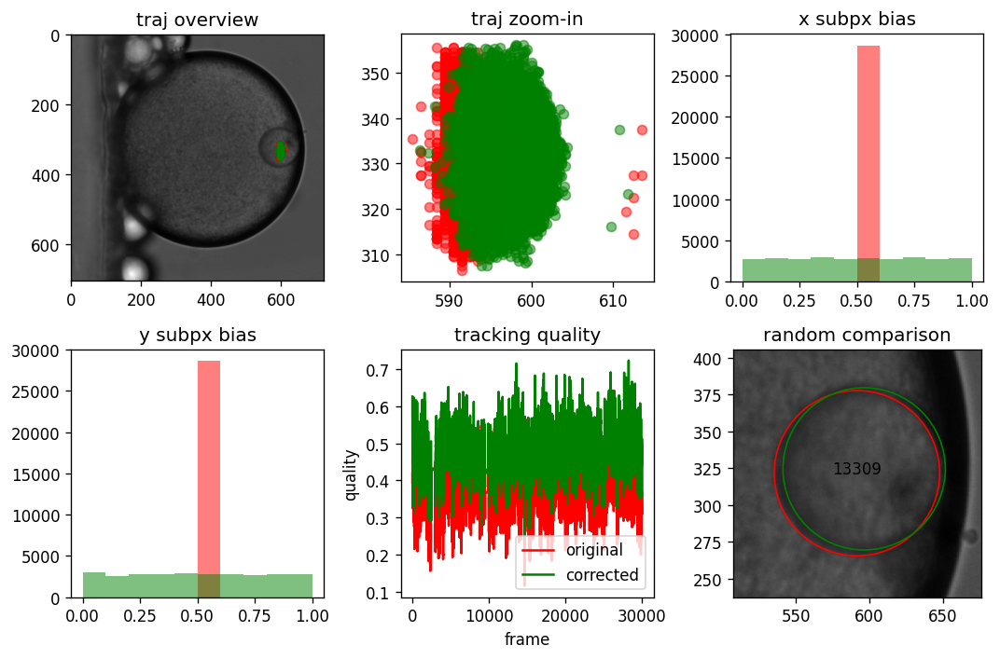

In [1013]:
analysis_folder = r"C:\Users\liuzy\Documents\05312022\Analysis\10"
img_folder = r"D:\DE\05312022\10\8-bit"
original_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
corrected_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")
generate_correction_report(original_traj, corrected_traj, img_folder, analysis_folder, 
                           report_name="correction-report-t1.jpg")

### 2.3 Iterative correction

Sometimes, 1 correction is not enough to give the most accurate position. In this section, we progressively correct the frames where the corrected quality is lower than the original quality, using different correction parameters. The general workflow goes as:

1. Identify bad corrections. Currently, 2 criteria are imposed -- quality and size. This is done in the previous section where we summarize the correction results.
2. Sample several frames from the bad correction set. Identify the problem in the parameters and make adjustments.
3. Apply the new params on 10-frame samples, see if the improvement is general.
4. Apply the new params on the whole bad correction set and assign corrected results to the original data.
5. Identify bad corrections in the modified data, and go back to step 2.

[28116, 20]
20 frames out of 28136 frames are bad.


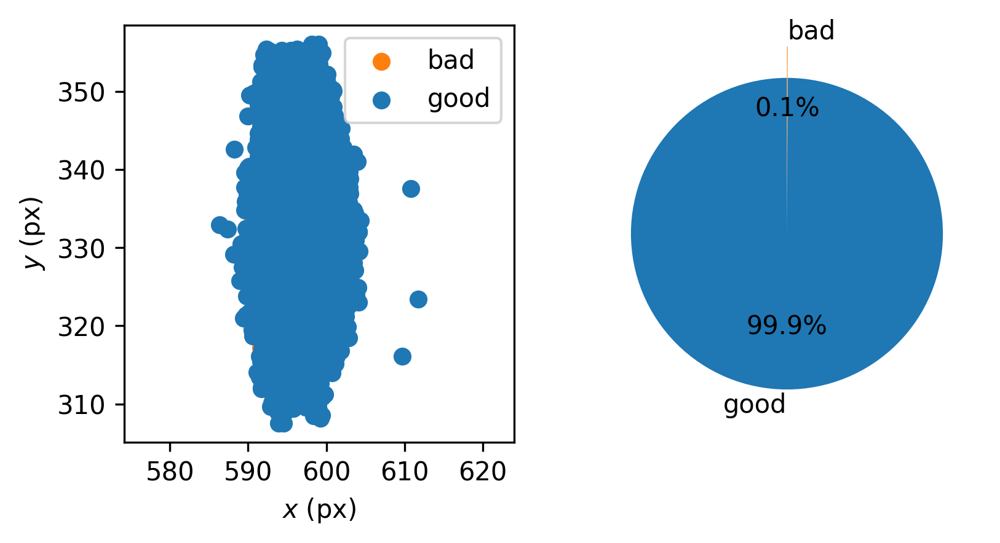

In [1016]:
# test identify_bad_correction(corrected_traj)
corrected_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv")).set_index("frame")
bad_tracking = identify_bad_correction(corrected_traj)
print("{0:d} frames out of {1:d} frames are bad.".format(len(bad_tracking), len(corrected_traj)))

**Find new params**

In [996]:
# read the correction params used, as a reference to set new params
with open(os.path.join(analysis_folder, "correction_paramst0c.json"), "r") as f:
    params_used = json.load(f)
del params_used["plot"]
params_used

{'range_factor': 0.4, 'thres': 10, 'method': 'minimum'}

In [960]:
# this line is used later
params_used = params 

In [999]:
# manually input a different parameter set and test using the block below
params = {'range_factor': 0.2,
 'thres': 15,
 'method': 'minimum',
 'sample': 15,
 "sample_range": (0, 6.28)}

Frame 11513
Original quality: -0.08
Initial correction quality: -0.15
Correction quality: 0.25


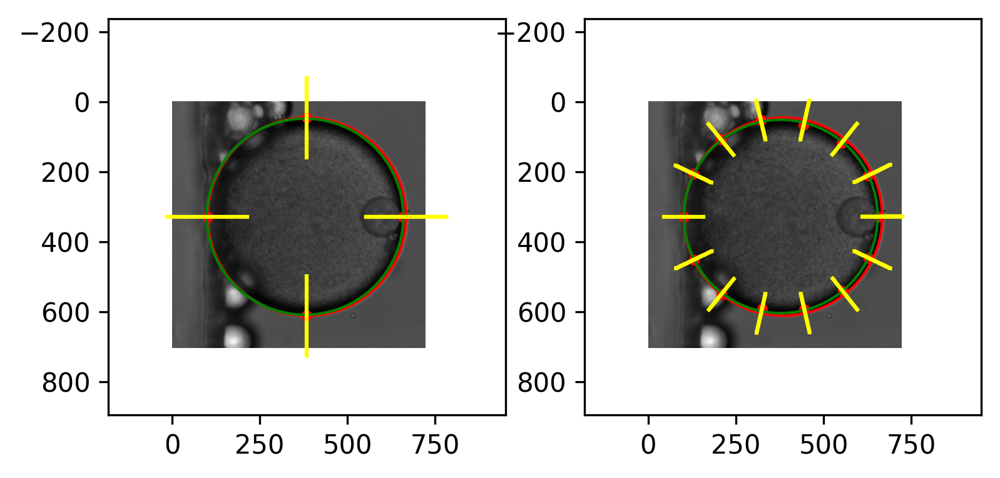

In [1006]:
# Sample some frames from the bad_tracking list to identify problems
fig, ax = plt.subplots(1, 2, figsize=(6, 3), dpi=300)
sample = bad_tracking.sample()
for frame, i in sample.iterrows():
    raw_img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    x0, y0, r0 = original_traj.loc[frame].x, original_traj.loc[frame].y, original_traj.loc[frame].r
    original_circle = {"x": x0, "y": y0, "r": r0}
    corrected_circle0 = subpixel_correction(original_circle, raw_img, **params_used, plot=True, ax=ax[0])
    corrected_circle = subpixel_correction(original_circle, raw_img, **params, plot=True, ax=ax[1])
    cq = circle_quality_std(raw_img, corrected_circle)
    ax[0].set_xlim([x0-2*r0, x0+2*r0])
    ax[0].set_ylim([y0+2*r0, y0-2*r0])
    ax[1].set_xlim([x0-2*r0, x0+2*r0])
    ax[1].set_ylim([y0+2*r0, y0-2*r0])
    print("Frame {:05d}".format(frame))
    print("Original quality: {:.2f}".format(i.original_quality))
    print("Initial correction quality: {:.2f}".format(i.corrected_quality))
    print("Correction quality: {:.2f}".format(cq))

#### Sample multiple frames and identify problems, see if overall quality is improved

Improvement: 0.31


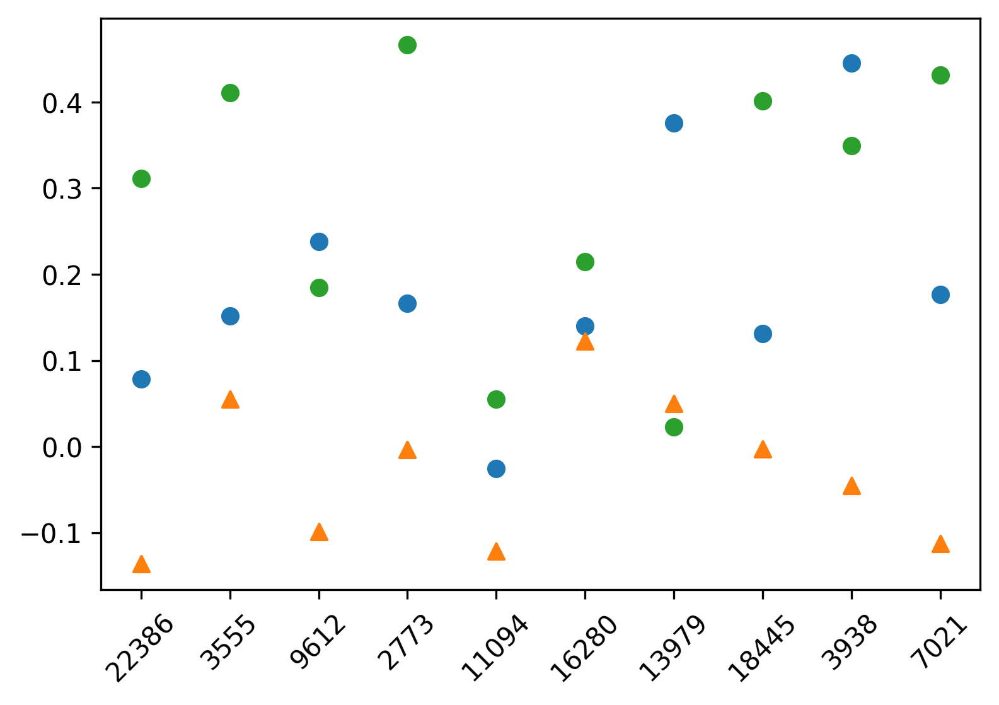

In [1007]:
# Sample some frames from the bad_tracking list to identify problems
n = 10 # number of samples
sample = bad_tracking.sample(n)
cq_list = []
for frame, i in sample.iterrows():
    raw_img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
#     inner_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
    x0, y0, r0 = original_traj.loc[frame].x, original_traj.loc[frame].y, original_traj.loc[frame].r
    original_circle = {"x": x0, "y": y0, "r": r0}
    corrected_circle0 = subpixel_correction(original_circle, raw_img, **params_used, plot=False)
    corrected_circle = subpixel_correction(original_circle, raw_img, **params, plot=False)
    cq = circle_quality_std(raw_img, corrected_circle)
    cq_list.append(cq)
x = range(0, n)
fig, ax = plt.subplots(dpi=300)
ax.scatter(x, sample.original_quality)
ax.scatter(x, sample.corrected_quality, marker="^")
ax.scatter(x, cq_list)
a = ax.set_xticks(x, labels=sample.index, rotation=45)
new_parameter_q = np.array(cq_list)
corrected_q = sample.corrected_quality
improvement = (new_parameter_q - corrected_q).mean()
print("Improvement: {:.2f}".format(improvement))

Frame 07969
Original quality: -0.00
Correction quality: 0.31


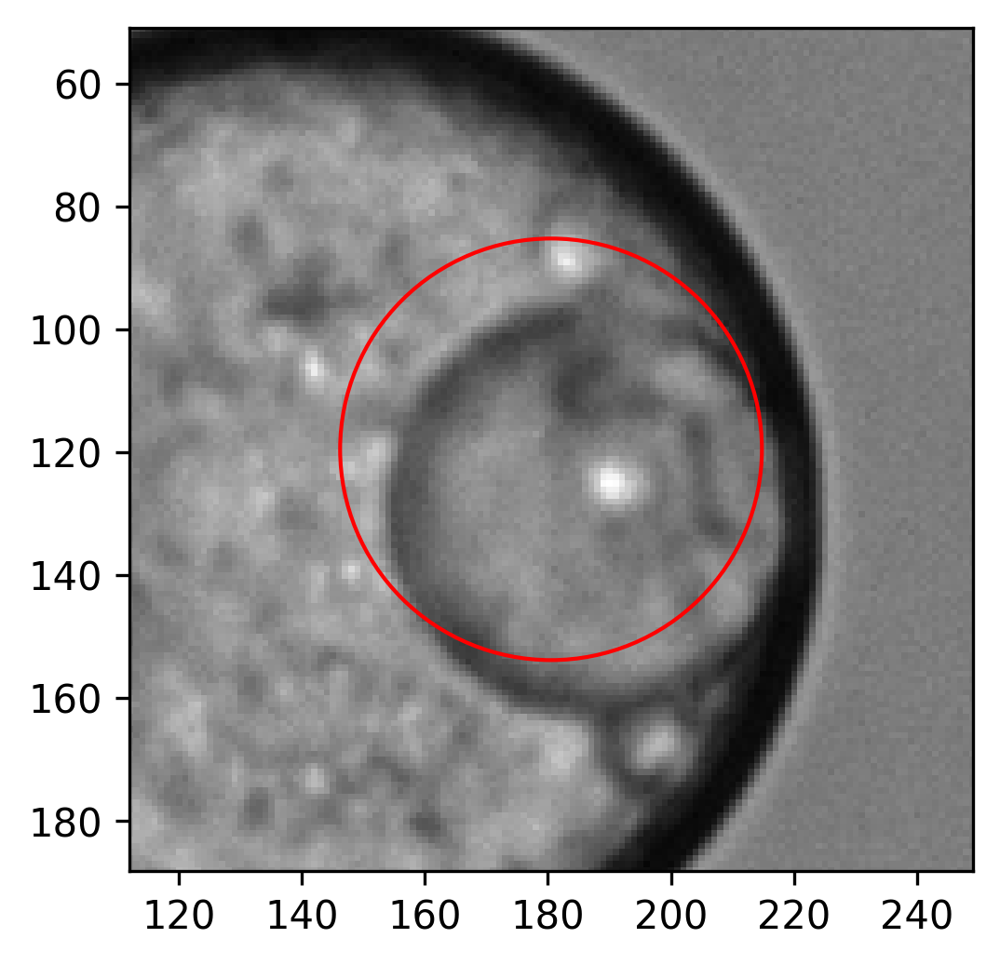

In [513]:
# Check bad frame to identify problems, if there is a spurious frame in the batch test above
fig, ax = plt.subplots(dpi=300)
frame = 7969
raw_img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
ax.imshow(raw_img, cmap="gray")
inner_traj = pd.read_csv(os.path.join(analysis_folder, "fulltraj_t1l.csv")).set_index("frame")
x0, y0, r0 = original_traj.loc[frame].x, original_traj.loc[frame].y, original_traj.loc[frame].r
original_circle = {"x": x0, "y": y0, "r": r0}
c1 = mpatch.Circle((original_circle["x"], original_circle["y"]), original_circle["r"], fill=False, lw=1, color="red")
ax.add_patch(c1)
# corrected_circle = subpixel_correction(original_circle, raw_img, **params, plot=True, ax=ax)
oq = circle_quality_std(raw_img, original_circle)
# cq = circle_quality_std(raw_img, corrected_circle)
ax.set_xlim([x0-2*r0, x0+2*r0])
ax.set_ylim([y0+2*r0, y0-2*r0])

print("Frame {:05d}".format(frame))
print("Original quality: {:.2f}".format(oq))
print("Correction quality: {:.2f}".format(cq))

#### Apply the new parameter on the bad_tracknig list

In [1008]:
# Use params to redo bad_tracking
t = corrected_traj.copy()
count = 0
length = len(bad_tracking)
for frame, i in bad_tracking.iterrows():
    raw_img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    x0, y0, r0 = original_traj.loc[frame].x, original_traj.loc[frame].y, original_traj.loc[frame].r
    original_circle = {"x": x0, "y": y0, "r": r0}
    corrected_circle = subpixel_correction(original_circle, raw_img, **params, plot=False)
    cq = circle_quality_std(raw_img, corrected_circle)
    t.loc[frame, ["x", "y", "r"]] = corrected_circle["x"], corrected_circle["y"], corrected_circle["r"]
    t.loc[frame, "corrected_quality"] = cq
    count += 1
    show_progress(count/length)    

[28153, 1847]
1847 frames out of 30000 frames are bad.


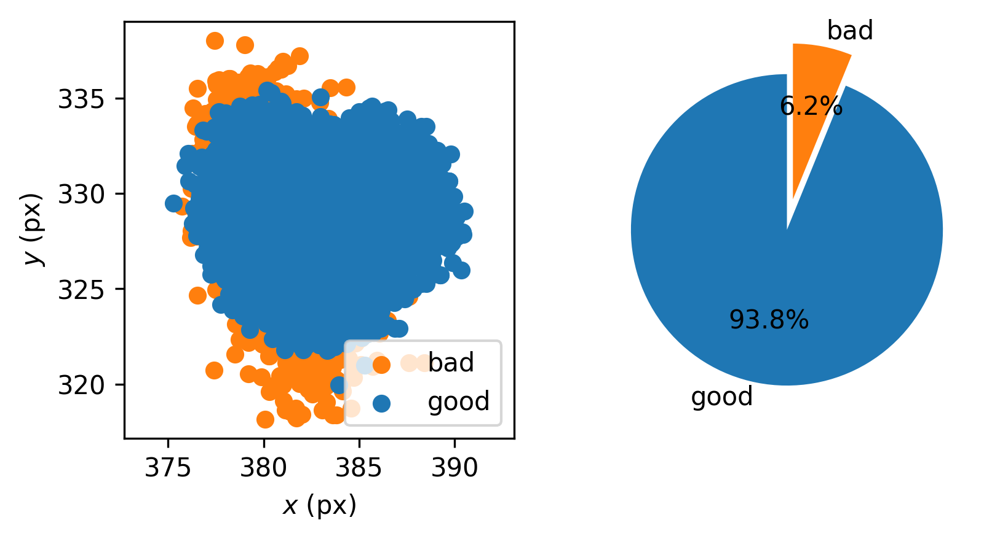

In [1009]:
corrected_traj = t.copy()
bad_tracking = identify_bad_correction(corrected_traj)
print("{0:d} frames out of {1:d} frames are bad.".format(len(bad_tracking), len(corrected_traj)))

Go back to "Find new params" and repeat the process, until the length of bad_tracking gets very small. Sometimes, the initial tracking is not great and correction is not possible with this technique. In this case, remove those rows and save the trajectory as the final corrected result.

In [1010]:
# remove the "impossible" rows
print("corrected_traj length: {:d}".format(len(corrected_traj)))
final_traj = corrected_traj.drop(labels=bad_tracking.index)
print("final_traj length: {:d}".format(len(final_traj)))

corrected_traj length: 30000
final_traj length: 28153


In [1011]:
# save corrected results
final_traj.to_csv(os.path.join(analysis_folder, "fulltraj_t1lc.csv"))

#### Check the corrected trajectory by overlay plots

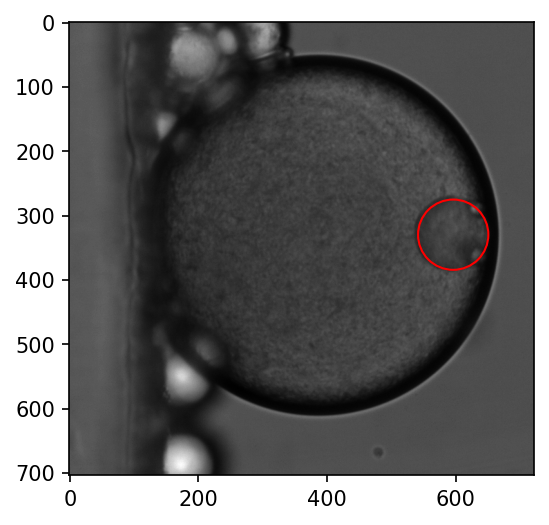

In [1017]:
for frame, i in corrected_traj[::100].iterrows():
    img = io.imread(os.path.join(img_folder, "{:05d}.tif".format(frame)))
    fig, ax = plt.subplots(dpi=150)
    ax.imshow(img, cmap="gray")
    circ = mpatch.Circle((i.x, i.y), i.r, fill=False, color="red", lw=1)
    ax.add_patch(circ)
    plt.pause(.1)
    plt.close()
    clear_output(wait=True)

## 3 Post processing

### 3.1 Subtract outer traj from inner traj

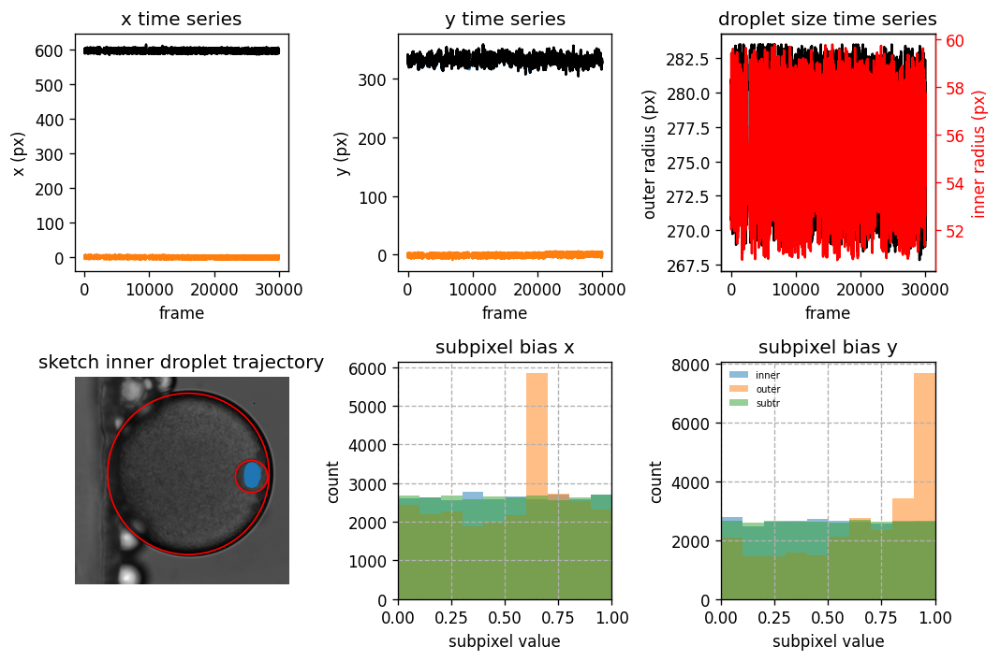

In [1012]:
# test subtraction_report()
analysis_folder = r"C:\Users\liuzy\Documents\05312022\Analysis\10"
img_folder = r"D:\DE\05312022\10\8-bit"
subtraction_report(analysis_folder, img_folder)

## 4 Verify trajectories

I thought the trajectories I got were OK but actually there exists artifacts I did not spot. In this section, I verify the trajectories again.

In [7]:
traj_folder = r"..\Data\traj"
nd2_folder = r"D:\nd2"

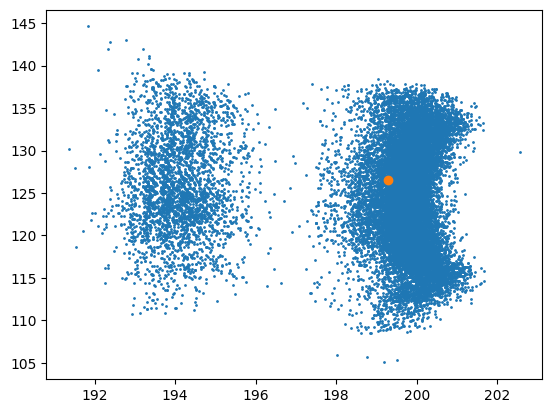

In [9]:
i = 193
traj = pd.read_csv(os.path.join(traj_folder, "{:02d}.csv".format(i)))
plt.scatter(traj.x, traj.y, s=1)
plt.scatter(traj.at[0, "x"], traj.at[0, "y"])

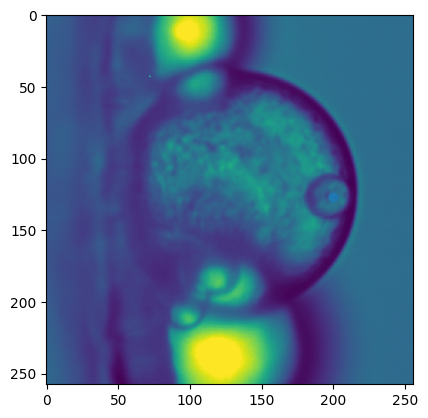

In [21]:
frame = 1300
with ND2Reader(os.path.join(nd2_folder, "{:02d}.nd2".format(i))) as images:
    plt.imshow(images[frame])
    plt.scatter(traj.at[frame, "x"], traj.at[frame, "y"])

In [10]:
traj

,frame,x,y,particle
0,0,160.614544,122.265961,0
1,1,158.378430,123.005627,0
2,2,NaN,NaN,0
3,3,157.935055,122.556555,0
4,4,155.577078,121.573522,0
...,...,...,...,...
29995,29995,NaN,NaN,0
29996,29996,158.845343,118.007929,0
29997,29997,158.987062,118.005573,0
29998,29998,154.068323,123.065141,0
